# SHAP feature selection #
## Code to select feature with combination of LightGBM and SHAP ##

## Parameters cell ##

Parameters are overiddent by papermill when run inside DVC stages



In [3]:
n_folds = 5 # this sets global setting of which how many bootstraps to use
n_hold_out = 0#1
repeats = 10
importance_type = "split"
opt_metrics = "r2"

life_history = ["lifespan", "mass_kg", "mtGC", "metabolic_rate", "temperature", "gestation_days"]
debug_local = True #to use local version

In [4]:
from pathlib import Path
import sys
import inspect

#lgb_params["importance_type"] = importance_type

local = (Path("..") / "yspecies").resolve()
if debug_local and local.exists():
  sys.path.insert(0, Path("..").as_posix())
  #sys.path.insert(0, local.as_posix())
  print("extending pathes with local yspecies")
  print(sys.path)
  %load_ext autoreload
  %autoreload 2

extending pathes with local yspecies
['..', '/data/sources/yspecies/notebooks', '/opt/miniconda3/envs/yspecies/lib/python38.zip', '/opt/miniconda3/envs/yspecies/lib/python3.8', '/opt/miniconda3/envs/yspecies/lib/python3.8/lib-dynload', '', '/opt/miniconda3/envs/yspecies/lib/python3.8/site-packages', '/opt/miniconda3/envs/yspecies/lib/python3.8/site-packages/IPython/extensions', '/home/antonkulaga/.ipython']


In [5]:
from dataclasses import dataclass, replace
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
from typing import *
from yspecies.dataset import *
from yspecies.utils import *
from yspecies.config import *
from yspecies.preprocess import FeatureSelection
from yspecies.partition import PartitionParameters
from yspecies.models import Metrics
from yspecies.explanations import FeatureSummary

In [7]:
import optuna
from optuna import Study, Trial
from optuna import multi_objective
from optuna.multi_objective import trial
from optuna.multi_objective.study import MultiObjectiveStudy
from yspecies.tuning import MultiObjectiveResults

In [8]:
#settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
import pprint
pp = pprint.PrettyPrinter(indent=4)

#charts settings
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
%matplotlib auto
plt.ioff()
set_matplotlib_formats('svg')

Using matplotlib backend: TkAgg


### Loading data ###
Let's load data from species/genes/expressions selected by select_samples.py notebook

In [9]:
from pathlib import Path
locations: Locations = Locations("./") if Path("./data").exists() else Locations("../")

## Setting up Features to select ##

In [10]:
default_selection = FeatureSelection(
    samples = ["tissue","species"], #samples metadata to include
    species =  [], #species metadata other then Y label to include
    exclude_from_training = ["species"],  #exclude some fields from LightGBM training
    to_predict = "lifespan", #column to predict
    categorical = ["tissue"],
    select_by = "shap",
    importance_type =  importance_type,
    feature_perturbation = "tree_path_dependent"
)
default_selection

Samples metadata,Species metadata,Genes,Predict label,not_validated species
"['tissue', 'species']",[],all,lifespan,[]


In [11]:
loader = DataLoader(locations, default_selection)
selections = loader.load_life_history()
selections["lifespan"][0]

expressions,genes,species,samples,Genes Metadata,Species Metadata
"(408, 12323)","(12323, 37)",38,408,"(12323, 2)","(38, 18)"


In [13]:
selections["lifespan"][0].expressions.head(10)

,ENSG00000139990,ENSG00000073921,ENSG00000139687,ENSG00000119977,ENSG00000242866,ENSG00000135506,ENSG00000162426,ENSG00000165995,ENSG00000073756,ENSG00000138050,ENSG00000097007,ENSG00000085840,ENSG00000117625,ENSG00000140519,ENSG00000107643,ENSG00000179915,ENSG00000068912,ENSG00000103479,ENSG00000065609,ENSG00000102854,ENSG00000167771,ENSG00000158270,ENSG00000111335,ENSG00000126464,ENSG00000158715,ENSG00000144535,ENSG00000187955,ENSG00000066629,ENSG00000162006,ENSG00000157510,ENSG00000089127,ENSG00000140612,ENSG00000132677,ENSG00000125733,ENSG00000172375,ENSG00000188859,ENSG00000104957,ENSG00000131914,ENSG00000100568,ENSG00000196526,ENSG00000112077,ENSG00000080839,ENSG00000134461,ENSG00000142694,ENSG00000120699,ENSG00000164125,ENSG00000116128,ENSG00000176871,ENSG00000165209,ENSG00000136731,ENSG00000105894,ENSG00000162551,ENSG00000178764,ENSG00000137942,ENSG00000106511,ENSG00000184831,ENSG00000144649,ENSG00000166938,ENSG00000104047,ENSG00000169129,ENSG00000005102,ENSG00000124789,ENSG00000089057,ENSG00000139163,ENSG00000120594,ENSG00000186174,ENSG00000124449,ENSG00000167674,ENSG00000187239,ENSG00000144815,ENSG00000196510,ENSG00000087053,ENSG00000164970,ENSG00000063601,ENSG00000119403,ENSG00000072840,ENSG00000166797,ENSG00000175556,ENSG00000161381,ENSG00000023902,ENSG00000116688,ENSG00000094880,ENSG00000108381,ENSG00000174306,ENSG00000168906,ENSG00000004897,ENSG00000115590,ENSG00000147649,ENSG00000110721,ENSG00000132182,ENSG00000215271,ENSG00000140986,ENSG00000031698,ENSG00000143033,ENSG00000151224,ENSG00000047230,ENSG00000115602,ENSG00000130177,ENSG00000090565,ENSG00000176909,ENSG00000153707,ENSG00000113615,ENSG00000125089,ENSG00000116670,ENSG00000115607,ENSG00000170162,ENSG00000092850,ENSG00000157992,ENSG00000187257,ENSG00000066583,ENSG00000147679,ENSG00000063241,ENSG00000104728,ENSG00000112378,ENSG00000206538,ENSG00000173214,ENSG00000138834,ENSG00000155508,ENSG00000181704,ENSG00000143322,ENSG00000166482,ENSG00000134265,ENSG00000173040,ENSG00000119616,ENSG00000129255,ENSG00000081019,ENSG00000277893,ENSG00000198791,ENSG00000182208,ENSG00000127863,ENSG00000121104,ENSG00000105402,ENSG00000145817,ENSG00000131100,ENSG00000121690,ENSG00000203740,ENSG00000149639,ENSG00000074964,ENSG00000135960,ENSG00000127955,ENSG00000189043,ENSG00000145545,ENSG00000236699,ENSG00000125814,ENSG00000119820,ENSG00000163382,ENSG00000124785,ENSG00000185818,ENSG00000186765,ENSG00000035499,ENSG00000146834,ENSG00000164120,ENSG00000185028,ENSG00000104763,ENSG00000007372,ENSG00000105261,ENSG00000188735,ENSG00000182575,ENSG00000137868,ENSG00000141391,ENSG00000172987,ENSG00000101166,ENSG00000198805,ENSG00000099797,ENSG00000100243,ENSG00000173083,ENSG00000024526,ENSG00000183111,ENSG00000131730,ENSG00000160606,ENSG00000099994,ENSG00000160959,ENSG00000186666,ENSG00000082641,ENSG00000178460,ENSG00000101935,ENSG00000205678,ENSG00000104879,ENSG00000132703,ENSG00000197561,ENSG00000260314,ENSG00000100528,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000001036,ENSG00000001084,ENSG00000001167,ENSG00000001460,ENSG00000001461,ENSG00000001497,ENSG00000001561,ENSG00000001617,ENSG00000001626,ENSG00000001629,ENSG00000001630,ENSG00000002016,ENSG00000002549,ENSG00000002587,ENSG00000002726,ENSG00000002745,ENSG00000002746,ENSG00000002822,ENSG00000002834,ENSG00000002919,ENSG00000002933,ENSG00000003056,ENSG00000003137,ENSG00000003147,ENSG00000003249,ENSG00000003393,ENSG00000003402,ENSG00000003436,ENSG00000003509,ENSG00000003756,ENSG00000003987,ENSG00000003989,ENSG00000004059,ENSG00000004139,ENSG00000004142,ENSG00000004399,ENSG00000004455,ENSG00000004478,ENSG00000004487,ENSG00000004534,ENSG00000004660,ENSG00000004700,ENSG00000004766,ENSG00000004776,ENSG00000004777,ENSG00000004779,ENSG00000004799,ENSG00000004838,ENSG00000004848,ENSG00000004864,ENSG00000004866,ENSG00000004939,ENSG00000004948,ENSG00000004961,ENSG00000004975,ENSG00000005001,ENSG00000005007,ENSG00000005020,ENSG00000005059,ENSG00000005073,ENSG00000005100,ENSG00000005108,ENSG00000005156

## Setting up SHAP selection pipeline ##

In [10]:
from yspecies.helpers import PipelineFactory
factory = PipelineFactory(locations,repeats, n_folds, n_hold_out)


In [11]:
pipelines = {trait:factory.make_repeated_shap_pipeline(trait, opt_metrics=opt_metrics) for trait in life_history}
#pipelines = {trait:factory.make_shap_pipeline(trait) for trait in life_history}

#make_partitioning_shap_pipeline
pipelines.keys()

create_study is experimental (supported from v1.4.0). The interface can change in the future.
NSGAIIMultiObjectiveSampler is experimental (supported from v1.5.0). The interface can change in the future.
RandomMultiObjectiveSampler is experimental (supported from v1.4.0). The interface can change in the future.
[I 2020-11-11 02:47:14,332] Using an existing study with name 'lifespan_r2_huber_kendall' instead of creating a new one.


loading (if exists) study from sqlite:////data/sources/yspecies/notebooks/../data/interim/optimization/lifespan.sqlite


MultiObjectiveStudy is experimental (supported from v1.4.0). The interface can change in the future.
FrozenMultiObjectiveTrial is experimental (supported from v1.4.0). The interface can change in the future.
[I 2020-11-11 02:47:17,381] Using an existing study with name 'mass_kg_r2_huber_kendall' instead of creating a new one.


loading (if exists) study from sqlite:////data/sources/yspecies/notebooks/../data/interim/optimization/mass_kg.sqlite


[I 2020-11-11 02:47:17,867] Using an existing study with name 'mtGC_r2_huber_kendall' instead of creating a new one.


loading (if exists) study from sqlite:////data/sources/yspecies/notebooks/../data/interim/optimization/mtGC.sqlite


[I 2020-11-11 02:47:20,271] Using an existing study with name 'metabolic_rate_r2_huber_kendall' instead of creating a new one.


loading (if exists) study from sqlite:////data/sources/yspecies/notebooks/../data/interim/optimization/metabolic_rate.sqlite


[I 2020-11-11 02:47:20,572] Using an existing study with name 'temperature_r2_huber_kendall' instead of creating a new one.
[I 2020-11-11 02:47:20,598] Using an existing study with name 'gestation_days_r2_huber_kendall' instead of creating a new one.


loading (if exists) study from sqlite:////data/sources/yspecies/notebooks/../data/interim/optimization/temperature.sqlite
FALLING BACK TO DEFAULT PARAMETERS
loading (if exists) study from sqlite:////data/sources/yspecies/notebooks/../data/interim/optimization/gestation_days.sqlite


dict_keys(['lifespan', 'mass_kg', 'mtGC', 'metabolic_rate', 'temperature', 'gestation_days'])

# First stage selection (shap ) #

In [12]:
stage_one = {}

In [13]:
def run_stage_one(trait: str):
    result = pipelines[trait].fit_transform(selections[trait])
    stage_one[trait] = result #ugly mutation of stage_one dicionary
    return result

## Lifespan ##

In [14]:
stage_one_lifespan = run_stage_one("lifespan")
stage_one_lifespan.selected

2020-11-11 02:47:22.649 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-11-11 02:47:22.650 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10}
2020-11-11 02:47:22.711 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Pan_paniscus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:47:53.842 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Capra_hircus']


Early stopping, best iteration is:
[88]	valid_0's l1: 7.19976	valid_0's l2: 145.538	valid_0's huber: 6.13569
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:48:39.693 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 2 | VALIDATION_SPECIES: ['Bos_taurus', 'Otolemur_garnettii']


Early stopping, best iteration is:
[153]	valid_0's l1: 3.72065	valid_0's l2: 45.1259	valid_0's huber: 3.01525
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:49:26.996 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Microcebus_murinus']


Early stopping, best iteration is:
[138]	valid_0's l1: 3.03845	valid_0's l2: 32.7294	valid_0's huber: 2.40662
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:50:26.254 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Felis_catus', 'Pan_troglodytes']


Early stopping, best iteration is:
[183]	valid_0's l1: 3.02283	valid_0's l2: 33.0322	valid_0's huber: 2.3831
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[106]	valid_0's l1: 3.17398	valid_0's l2: 29.6323	valid_0's huber: 2.51577


2020-11-11 02:51:17.161 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9246526388668274, MAE=4.031133990541529, MSE=57.21158292663573, huber=3.2906634228868072)
2020-11-11 02:51:17.228 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-11-11 02:51:17.230 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 0}
2020-11-11 02:51:17.280 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Felis_catus', 'Ursus_americanus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:52:01.512 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 1 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Vombatus_ursinus']


Early stopping, best iteration is:
[95]	valid_0's l1: 3.68333	valid_0's l2: 33.9969	valid_0's huber: 2.95567
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:52:53.170 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Rhinopithecus_bieti']


Early stopping, best iteration is:
[87]	valid_0's l1: 4.46434	valid_0's l2: 63.9619	valid_0's huber: 3.69998
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:54:35.034 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Ovis_aries']


Early stopping, best iteration is:
[201]	valid_0's l1: 2.6059	valid_0's l2: 20.965	valid_0's huber: 2.0132
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:56:16.582 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[201]	valid_0's l1: 4.43317	valid_0's l2: 73.381	valid_0's huber: 3.66424
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[214]	valid_0's l1: 3.06978	valid_0's l2: 36.2584	valid_0's huber: 2.44288


2020-11-11 02:58:07.286 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9356085299969878, MAE=3.6513047981189173, MSE=45.71263599516901, huber=2.9496214407484724)
2020-11-11 02:58:07.385 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-11-11 02:58:07.387 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 1}
2020-11-11 02:58:07.451 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Rhinopithecus_bieti', 'Ursus_americanus']
Found `early_stopping_round` in params. Will use it instead of 

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 02:59:28.980 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 1 | VALIDATION_SPECIES: ['Aotus_nancymaae', 'Phascolarctos_cinereus']


Early stopping, best iteration is:
[174]	valid_0's l1: 3.07981	valid_0's l2: 38.3278	valid_0's huber: 2.43704
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:00:36.408 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 2 | VALIDATION_SPECIES: ['Vombatus_ursinus', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[129]	valid_0's l1: 3.61557	valid_0's l2: 31.4308	valid_0's huber: 2.9186
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:01:42.229 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Monodelphis_domestica']


Early stopping, best iteration is:
[125]	valid_0's l1: 3.63086	valid_0's l2: 55.1932	valid_0's huber: 2.92872
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:03:30.773 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Bos_taurus', 'Tupaia_belangeri']


[250]	valid_0's l1: 7.78715	valid_0's l2: 121.838	valid_0's huber: 6.63997
Did not meet early stopping. Best iteration is:
[250]	valid_0's l1: 7.78715	valid_0's l2: 121.838	valid_0's huber: 6.63997
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[71]	valid_0's l1: 3.47087	valid_0's l2: 40.8103	valid_0's huber: 2.76301


2020-11-11 03:04:26.826 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9029740041646577, MAE=4.316850548616003, MSE=57.51995149570786, huber=3.5361747291347)
2020-11-11 03:04:27.121 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-11-11 03:04:27.122 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 2}
2020-11-11 03:04:27.171 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Microcebus_murinus', 'Pan_paniscus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:05:51.811 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 1 | VALIDATION_SPECIES: ['Ursus_americanus', 'Gorilla_gorilla']


Early stopping, best iteration is:
[177]	valid_0's l1: 2.87234	valid_0's l2: 27.9791	valid_0's huber: 2.24004
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:07:05.396 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Bos_taurus', 'Capra_hircus']


Early stopping, best iteration is:
[140]	valid_0's l1: 6.46112	valid_0's l2: 94.6238	valid_0's huber: 5.45335
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:08:21.107 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Mus_musculus']


Early stopping, best iteration is:
[139]	valid_0's l1: 3.31768	valid_0's l2: 43.2744	valid_0's huber: 2.65811
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:09:45.560 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Suricata_suricatta', 'Meriones_unguiculatus']


Early stopping, best iteration is:
[151]	valid_0's l1: 2.86569	valid_0's l2: 25.4216	valid_0's huber: 2.24454
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[129]	valid_0's l1: 2.99004	valid_0's l2: 29.0231	valid_0's huber: 2.3582


2020-11-11 03:11:10.981 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9392830808788654, MAE=3.7013724664871033, MSE=44.064401270870135, huber=2.9888884145030277)
2020-11-11 03:11:11.672 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-11-11 03:11:11.674 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 3}
2020-11-11 03:11:11.731 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Pan_troglodytes']
Found `early_stopping_round` in params. Will use it instead of 

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:12:37.057 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 1 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Ursus_americanus']


Early stopping, best iteration is:
[167]	valid_0's l1: 4.45369	valid_0's l2: 84.0444	valid_0's huber: 3.6718
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:13:52.922 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Cavia_aperea']


Early stopping, best iteration is:
[136]	valid_0's l1: 3.01683	valid_0's l2: 23.4436	valid_0's huber: 2.37886
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:14:33.488 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Pan_paniscus', 'Gorilla_gorilla']


Early stopping, best iteration is:
[59]	valid_0's l1: 5.59421	valid_0's l2: 79.6306	valid_0's huber: 4.69236
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:15:45.273 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Bos_taurus', 'Equus_caballus']


Early stopping, best iteration is:
[138]	valid_0's l1: 6.75044	valid_0's l2: 145.772	valid_0's huber: 5.73607
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[169]	valid_0's l1: 2.43093	valid_0's l2: 24.6421	valid_0's huber: 1.88982


2020-11-11 03:17:17.273 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9016911897198568, MAE=4.449222583959903, MSE=71.50665079342278, huber=3.6653058158256813)
2020-11-11 03:17:17.367 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-11-11 03:17:17.370 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 4}
2020-11-11 03:17:17.426 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Mus_spicilegus', 'Canis_lupus_familiaris']
Found `early_stopping_round` in params. Will use it instead of 

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:18:02.367 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 1 | VALIDATION_SPECIES: ['Ovis_aries', 'Heterocephalus_glaber']


Early stopping, best iteration is:
[69]	valid_0's l1: 2.87253	valid_0's l2: 22.0944	valid_0's huber: 2.23091
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:19:04.584 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Ursus_americanus', 'Oryctolagus_cuniculus']


Early stopping, best iteration is:
[113]	valid_0's l1: 3.57163	valid_0's l2: 42.1437	valid_0's huber: 2.86626
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:20:03.567 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_aperea', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[109]	valid_0's l1: 6.46174	valid_0's l2: 144.746	valid_0's huber: 5.46764
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:21:17.100 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Felis_catus', 'Rhinopithecus_bieti']


Early stopping, best iteration is:
[170]	valid_0's l1: 4.01752	valid_0's l2: 77.9956	valid_0's huber: 3.29112
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[88]	valid_0's l1: 2.84254	valid_0's l2: 31.2986	valid_0's huber: 2.2184


2020-11-11 03:22:20.938 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.911722027988383, MAE=3.953192377108499, MSE=63.65574284997937, huber=3.2112746731718196)
2020-11-11 03:22:21.003 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-11-11 03:22:21.004 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 5}
2020-11-11 03:22:21.050 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Heterocephalus_glaber']
Found `early_stopping_round` in params. Will use it in

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:23:07.339 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 1 | VALIDATION_SPECIES: ['Mus_spicilegus', 'Suricata_suricatta']


Early stopping, best iteration is:
[94]	valid_0's l1: 3.66302	valid_0's l2: 37.6046	valid_0's huber: 2.95223
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:24:13.017 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 2 | VALIDATION_SPECIES: ['Rhinopithecus_bieti', 'Ovis_aries']


Early stopping, best iteration is:
[163]	valid_0's l1: 3.10956	valid_0's l2: 41.3982	valid_0's huber: 2.47132
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:25:08.232 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Pan_troglodytes']


Early stopping, best iteration is:
[115]	valid_0's l1: 3.44484	valid_0's l2: 47.9188	valid_0's huber: 2.769
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:26:05.254 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Vombatus_ursinus', 'Sus_scrofa']


Early stopping, best iteration is:
[122]	valid_0's l1: 3.83902	valid_0's l2: 65.9981	valid_0's huber: 3.11685
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[103]	valid_0's l1: 2.91941	valid_0's l2: 32.3053	valid_0's huber: 2.30184


2020-11-11 03:27:14.743 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9358267913202096, MAE=3.395169660301799, MSE=45.04499424360979, huber=2.718061409608745)
2020-11-11 03:27:14.821 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-11-11 03:27:14.824 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 6}
2020-11-11 03:27:14.878 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Cavia_porcellus']
Found `early_stopping_round` in params. Will use it instead of argument

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:28:14.101 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 1 | VALIDATION_SPECIES: ['Pan_paniscus', 'Capra_hircus']


Early stopping, best iteration is:
[123]	valid_0's l1: 3.75138	valid_0's l2: 33.1592	valid_0's huber: 3.02897
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:29:16.870 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 2 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Ictidomys_tridecemlineatus']


Early stopping, best iteration is:
[146]	valid_0's l1: 3.26387	valid_0's l2: 44.7135	valid_0's huber: 2.61378
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:30:10.037 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Canis_lupus_familiaris', 'Ursus_americanus']


Early stopping, best iteration is:
[101]	valid_0's l1: 3.79785	valid_0's l2: 41.7174	valid_0's huber: 3.09612
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:31:14.733 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[151]	valid_0's l1: 2.94446	valid_0's l2: 43.579	valid_0's huber: 2.3427
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[76]	valid_0's l1: 2.9984	valid_0's l2: 33.7427	valid_0's huber: 2.36503


2020-11-11 03:32:09.451 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9444864457797776, MAE=3.351192100760047, MSE=39.382353600041, huber=2.685572936248564)
2020-11-11 03:32:10.192 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-11-11 03:32:10.194 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 7}
2020-11-11 03:32:10.242 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Pan_paniscus', 'Suricata_suricatta']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[152]	valid_0's l1: 2.5804	valid_0's l2: 32.0191	valid_0's huber: 2.00311


2020-11-11 03:33:13.883 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 1 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Tupaia_belangeri']


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:33:59.148 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Ursus_americanus', 'Capra_hircus']


Early stopping, best iteration is:
[94]	valid_0's l1: 3.57998	valid_0's l2: 35.9089	valid_0's huber: 2.88969
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:35:20.727 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Bos_taurus', 'Rhinolophus_ferrumequinum']


Early stopping, best iteration is:
[190]	valid_0's l1: 3.72318	valid_0's l2: 44.2886	valid_0's huber: 3.01608
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:36:38.689 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Sus_scrofa']


Early stopping, best iteration is:
[160]	valid_0's l1: 2.81913	valid_0's l2: 52.3629	valid_0's huber: 2.23579
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[150]	valid_0's l1: 3.14176	valid_0's l2: 32.7678	valid_0's huber: 2.51718


2020-11-11 03:37:58.388 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.9431361513678478, MAE=3.168891944863792, MSE=39.46947026133172, huber=2.529084231987601)
2020-11-11 03:37:58.976 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-11-11 03:37:58.978 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 8}
2020-11-11 03:37:59.038 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Aotus_nancymaae']
Found `early_stopping_round` in params. Will use it instead

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:38:49.595 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 1 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Oryctolagus_cuniculus']


Early stopping, best iteration is:
[110]	valid_0's l1: 3.9115	valid_0's l2: 43.3614	valid_0's huber: 3.18864
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:39:36.280 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 2 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Meriones_unguiculatus']


Early stopping, best iteration is:
[96]	valid_0's l1: 5.6937	valid_0's l2: 82.8679	valid_0's huber: 4.79542
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:40:18.831 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Microcebus_murinus']


Early stopping, best iteration is:
[85]	valid_0's l1: 5.29656	valid_0's l2: 62.6372	valid_0's huber: 4.41323
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-11-11 03:41:08.305 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Felis_catus']


Early stopping, best iteration is:
[101]	valid_0's l1: 5.81197	valid_0's l2: 109.359	valid_0's huber: 4.88991
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[155]	valid_0's l1: 2.95247	valid_0's l2: 26.1484	valid_0's huber: 2.34357


2020-11-11 03:42:29.119 | INFO     | yspecies.explanations:transform:646 - Metrics: 
Metrics(R2=0.909116294102083, MAE=4.733238624486459, MSE=64.87474281961457, huber=3.927041664017699)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000010219,DYRK4,10.000,2.384,0.325,2.257,0.286,2.549,0.242,2.801,0.300,1.859,0.355,2.170,0.334,2.884,0.401,2.374,0.274,1.851,0.278,2.803,0.401,2.291,0.379
ENSG00000204498,NFKBIL1,10.000,1.859,-0.128,1.642,-0.157,1.138,-0.048,2.441,-0.062,1.962,-0.235,2.722,-0.019,0.730,-0.106,1.755,-0.034,1.222,-0.237,2.127,-0.231,2.848,-0.148
ENSG00000167515,TRAPPC2L,10.000,1.543,-0.279,1.275,-0.376,1.440,-0.312,1.265,-0.372,2.010,-0.270,1.733,-0.200,0.935,-0.278,2.474,-0.206,1.367,-0.306,2.171,-0.256,0.753,-0.211
ENSG00000170835,CEL,10.000,1.068,0.693,1.181,0.717,1.101,0.682,1.096,0.729,0.675,0.701,0.932,0.645,1.267,0.654,0.840,0.651,1.310,0.724,0.960,0.741,1.316,0.683
ENSG00000105672,ETV2,10.000,1.018,0.713,1.007,0.686,0.990,0.716,0.752,0.776,0.863,0.711,1.499,0.690,0.600,0.726,1.158,0.711,1.208,0.743,1.067,0.685,1.033,0.689
ENSG00000185880,TRIM69,10.000,0.942,0.097,1.030,0.096,0.662,0.086,0.985,0.138,0.842,0.072,0.946,0.049,0.556,0.120,1.690,0.096,1.068,0.097,0.871,0.110,0.774,0.102
ENSG00000066923,STAG3,9.000,0.962,0.480,1.370,0.534,0.833,0.435,0.731,0.468,1.549,0.514,nan,nan,1.209,0.507,0.843,0.467,1.301,0.532,0.921,0.426,0.866,0.434
ENSG00000132436,FIGNL1,9.000,0.540,0.570,0.751,0.579,0.821,0.594,0.391,0.553,0.588,0.575,0.784,0.560,0.530,0.519,nan,nan,0.449,0.623,0.550,0.554,0.539,0.570
ENSG00000188747,NOXA1,9.000,0.413,0.689,nan,nan,0.394,0.736,0.634,0.721,0.422,0.628,0.411,0.692,0.347,0.743,0.539,0.654,0.545,0.626,0.426,0.708,0.411,0.689
ENSG00000013288,MAN2B2,9.000,0.307,-0.325,0.336,-0.276,0.618,-0.301,nan,nan,0.418,-0.295,0.292,-0.326,0.405,-0.314,0.162,-0.397,0.210,-0.305,0.333,-0.361,0.293,-0.353


## Charts for Lifespan ##

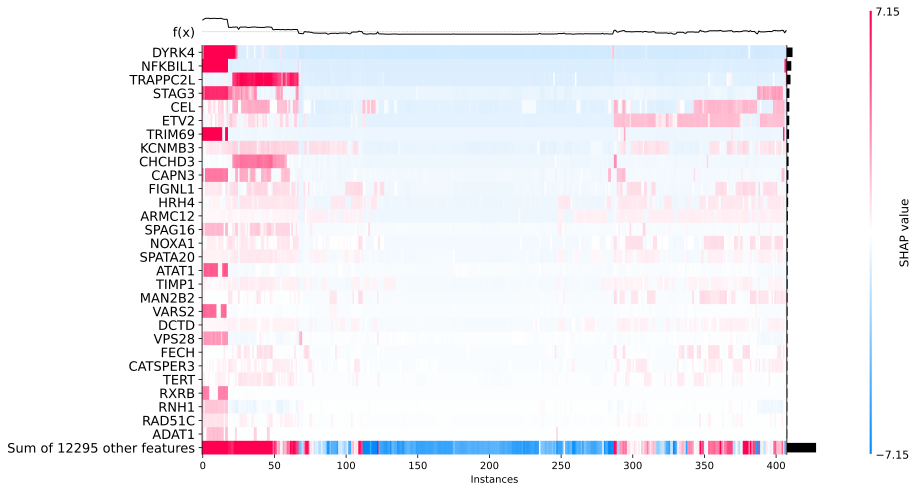

In [17]:
heatmap_stage_one_plot_path = locations.output.plots / "stage_one" / "heatmap_lifespan.svg"
stage_one_lifespan.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=True, save = heatmap_stage_one_plot_path)

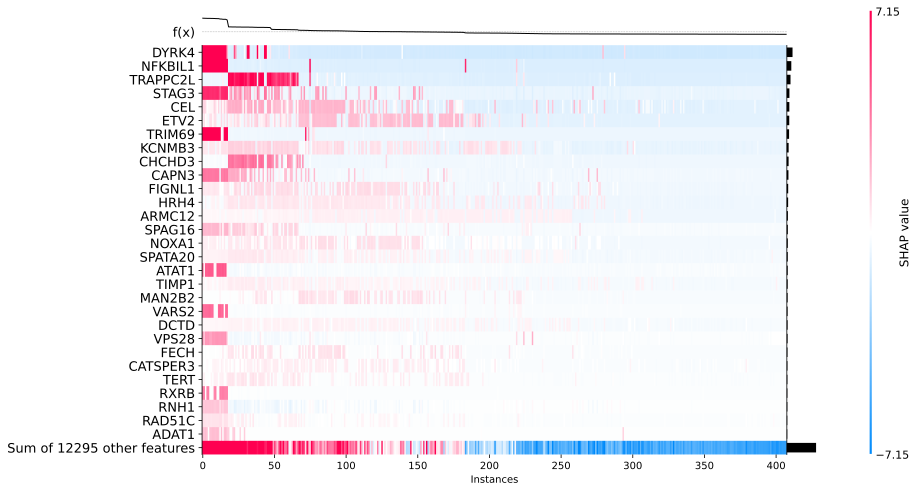

In [18]:
heatmap_uncl_stage_one_plot_path = locations.output.plots / "stage_one" / "heatmap_lifespan_unclustered.svg"
stage_one_lifespan.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=False, save = heatmap_uncl_stage_one_plot_path)

### saving partitions info  ###

In [19]:
stage_one_lifespan.write(locations.interim.stage_one / "partitions", "lifespan_stage_one")

PosixPath('../data/interim/stage_1/partitions')

### Mass_kg ###

In [20]:
stage_one_mass = run_stage_one("mass_kg")
stage_one_mass.selected

2020-10-15 23:32:11.024 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-10-15 23:32:11.025 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10}
2020-10-15 23:32:11.049 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Aotus_nancymaae']
Found `early_stopping_round` in params. Will use it instead of argument
Early stopping is not available in dart mode
2020-10-15 23:32:13.501 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Sus_scrofa', 'Oryctolagus_cuniculus'

[250]	valid_0's l1: 10.9715	valid_0's l2: 332.571	valid_0's huber: 9.50993


2020-10-15 23:32:16.136 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 2 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Cavia_porcellus']


[250]	valid_0's l1: 29.7375	valid_0's l2: 2258.84	valid_0's huber: 26.4168


2020-10-15 23:32:18.593 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Phascolarctos_cinereus']


[250]	valid_0's l1: 12.7621	valid_0's l2: 374.396	valid_0's huber: 11.1286


2020-10-15 23:32:21.481 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Suricata_suricatta']


[250]	valid_0's l1: 10.9439	valid_0's l2: 775.942	valid_0's huber: 9.48571
[250]	valid_0's l1: 8.11425	valid_0's l2: 511.406	valid_0's huber: 7.01932


2020-10-15 23:32:26.822 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7998223708997979, MAE=14.505852743291067, MSE=850.6303060021864, huber=12.712067838409213)
2020-10-15 23:32:26.864 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-10-15 23:32:26.865 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 0}
2020-10-15 23:32:26.891 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Aotus_nancymaae', 'Mesocricetus_auratus']
Found `early_stopping_round` in params. Will use it instead of

[250]	valid_0's l1: 6.60053	valid_0's l2: 213.566	valid_0's huber: 5.5862


2020-10-15 23:32:31.970 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Sus_scrofa']


[250]	valid_0's l1: 9.95402	valid_0's l2: 302.339	valid_0's huber: 8.58543


2020-10-15 23:32:34.925 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Cavia_porcellus']


[250]	valid_0's l1: 30.2798	valid_0's l2: 2097.63	valid_0's huber: 26.8955


2020-10-15 23:32:37.514 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Suricata_suricatta']


[250]	valid_0's l1: 24.5026	valid_0's l2: 1422.41	valid_0's huber: 21.6771
[250]	valid_0's l1: 20.6584	valid_0's l2: 1048.04	valid_0's huber: 18.2273


2020-10-15 23:32:42.226 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7437366567996347, MAE=18.399054702170407, MSE=1016.7955423169982, huber=16.194306163637314)
2020-10-15 23:32:42.265 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-10-15 23:32:42.266 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 1}
2020-10-15 23:32:42.290 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Meriones_unguiculatus']
Found `early_stopping_round` in params. Will use it instea

[250]	valid_0's l1: 6.91184	valid_0's l2: 176.272	valid_0's huber: 5.86597


2020-10-15 23:32:47.166 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 2 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Cavia_porcellus']


[250]	valid_0's l1: 8.21443	valid_0's l2: 338.728	valid_0's huber: 7.08194


2020-10-15 23:32:49.699 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Aotus_nancymaae']


[250]	valid_0's l1: 8.05211	valid_0's l2: 178.441	valid_0's huber: 6.89395


2020-10-15 23:32:52.614 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Otolemur_garnettii']


[250]	valid_0's l1: 34.1223	valid_0's l2: 2210.72	valid_0's huber: 30.3531
[250]	valid_0's l1: 7.88041	valid_0's l2: 205.466	valid_0's huber: 6.78057


2020-10-15 23:32:58.091 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8303026028540769, MAE=13.036214196990912, MSE=621.9251345658884, huber=11.395107378231412)
2020-10-15 23:32:58.129 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-10-15 23:32:58.130 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 2}
2020-10-15 23:32:58.154 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Rattus_norvegicus']
Found `early_stopping_round` in params. Will use it instead of

[250]	valid_0's l1: 8.24669	valid_0's l2: 212.25	valid_0's huber: 7.04254


2020-10-15 23:33:03.204 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Sus_scrofa', 'Aotus_nancymaae']


[250]	valid_0's l1: 18.4178	valid_0's l2: 1047.91	valid_0's huber: 16.2602


2020-10-15 23:33:05.903 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Mesocricetus_auratus']


[250]	valid_0's l1: 19.7022	valid_0's l2: 1149.05	valid_0's huber: 17.3981


2020-10-15 23:33:08.378 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Suricata_suricatta']


[250]	valid_0's l1: 12.5941	valid_0's l2: 591.213	valid_0's huber: 10.9859
[250]	valid_0's l1: 11.3286	valid_0's l2: 324.07	valid_0's huber: 9.82973


2020-10-15 23:33:13.910 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8375715681987812, MAE=14.057864184714862, MSE=664.8983410080643, huber=12.303299914371276)
2020-10-15 23:33:13.950 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-10-15 23:33:13.951 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 3}
2020-10-15 23:33:13.976 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Heterocephalus_glaber']
Found `early_stopping_round` in params. Will use it instea

[250]	valid_0's l1: 15.1372	valid_0's l2: 444.758	valid_0's huber: 13.2384


2020-10-15 23:33:19.007 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Homo_sapiens', 'Rattus_norvegicus']


[250]	valid_0's l1: 7.4358	valid_0's l2: 178.219	valid_0's huber: 6.33994


2020-10-15 23:33:21.279 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Ictidomys_tridecemlineatus']


[250]	valid_0's l1: 15.568	valid_0's l2: 821.272	valid_0's huber: 13.6547


2020-10-15 23:33:23.992 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Meriones_unguiculatus']


[250]	valid_0's l1: 7.88776	valid_0's l2: 291.967	valid_0's huber: 6.74741
[250]	valid_0's l1: 11.7718	valid_0's l2: 396.074	valid_0's huber: 10.2583


2020-10-15 23:33:28.652 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8606311857545365, MAE=11.560105341845809, MSE=426.45794612956644, huber=10.047760395418496)
2020-10-15 23:33:28.692 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-10-15 23:33:28.693 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 4}
2020-10-15 23:33:28.719 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Heterocephalus_glaber']
Found `early_stopping_round` in params. Will use it in

[250]	valid_0's l1: 17.1416	valid_0's l2: 642.053	valid_0's huber: 15.0433


2020-10-15 23:33:33.698 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Sus_scrofa', 'Ictidomys_tridecemlineatus']


[250]	valid_0's l1: 13.2796	valid_0's l2: 405.574	valid_0's huber: 11.6019


2020-10-15 23:33:36.298 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Otolemur_garnettii']


[250]	valid_0's l1: 15.5079	valid_0's l2: 537.54	valid_0's huber: 13.6111


2020-10-15 23:33:38.914 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Mesocricetus_auratus']


[250]	valid_0's l1: 4.10204	valid_0's l2: 159.519	valid_0's huber: 3.33946
[250]	valid_0's l1: 10.2841	valid_0's l2: 282.298	valid_0's huber: 8.91526


2020-10-15 23:33:43.665 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8984468514338598, MAE=12.063029341164928, MSE=405.39699610786295, huber=10.502211673890374)
2020-10-15 23:33:43.705 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-10-15 23:33:43.706 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 5}
2020-10-15 23:33:43.731 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Ictidomys_tridecemlineatus']
Found `early_stopping_round` in params. Will use it 

[250]	valid_0's l1: 9.28334	valid_0's l2: 307.983	valid_0's huber: 8.02614


2020-10-15 23:33:49.008 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 2 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Sus_scrofa']


[250]	valid_0's l1: 16.7967	valid_0's l2: 1054.69	valid_0's huber: 14.7837


2020-10-15 23:33:51.600 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Homo_sapiens']


[250]	valid_0's l1: 21.0091	valid_0's l2: 2037.87	valid_0's huber: 18.572


2020-10-15 23:33:54.200 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Monodelphis_domestica']


[250]	valid_0's l1: 25.1368	valid_0's l2: 1538.15	valid_0's huber: 22.2859
[250]	valid_0's l1: 10.3047	valid_0's l2: 320.755	valid_0's huber: 8.9327


2020-10-15 23:33:58.789 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7159526197856538, MAE=16.506129157741704, MSE=1051.888431079698, huber=14.52011296194431)
2020-10-15 23:33:58.828 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-10-15 23:33:58.828 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 6}
2020-10-15 23:33:58.853 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Ictidomys_tridecemlineatus']
Found `early_stopping_round` in params. Will use it in

[250]	valid_0's l1: 10.1493	valid_0's l2: 310.121	valid_0's huber: 8.75135


2020-10-15 23:34:07.735 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 2 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Monodelphis_domestica']


[250]	valid_0's l1: 30.7489	valid_0's l2: 1886.44	valid_0's huber: 27.2904


2020-10-15 23:34:10.168 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Rattus_norvegicus']


[250]	valid_0's l1: 9.47497	valid_0's l2: 299.192	valid_0's huber: 8.15754


2020-10-15 23:34:12.504 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Sus_scrofa']


[250]	valid_0's l1: 4.72887	valid_0's l2: 216.881	valid_0's huber: 3.89021
[250]	valid_0's l1: 36.1554	valid_0's l2: 2326.47	valid_0's huber: 32.1867


2020-10-15 23:34:20.861 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.789570919502982, MAE=18.251488656822367, MSE=1007.8209946311981, huber=16.0552446918864)
2020-10-15 23:34:20.900 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-10-15 23:34:20.901 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 7}
2020-10-15 23:34:20.927 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Otolemur_garnettii']
Found `early_stopping_round` in params. Will use it instead 

[250]	valid_0's l1: 19.4383	valid_0's l2: 1159.92	valid_0's huber: 17.1807


2020-10-15 23:34:29.835 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Aotus_nancymaae', 'Callithrix_jacchus']


[250]	valid_0's l1: 25.6567	valid_0's l2: 1398.98	valid_0's huber: 22.7073


2020-10-15 23:34:32.454 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Sus_scrofa']


[250]	valid_0's l1: 13.536	valid_0's l2: 496.881	valid_0's huber: 11.8185


2020-10-15 23:34:35.006 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Monodelphis_domestica']


[250]	valid_0's l1: 10.0365	valid_0's l2: 669.438	valid_0's huber: 8.64338
[250]	valid_0's l1: 13.2549	valid_0's l2: 400.167	valid_0's huber: 11.5522


2020-10-15 23:34:39.662 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7897897024086358, MAE=16.38447148414167, MSE=825.0769335145272, huber=14.38039797256474)
2020-10-15 23:34:39.703 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-10-15 23:34:39.704 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.49885668399953875, 'boosting_type': 'dart', 'drop_rate': 0.2372958868935867, 'feature_fraction': 0.49141007534802034, 'lambda_l1': 0.656412473127467, 'lambda_l2': 1.9535470163293591, 'learning_rate': 0.08702343727058373, 'max_depth': 3, 'max_leaves': 21, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 8}
2020-10-15 23:34:39.729 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Monodelphis_domestica']
Found `early_stopping_round` in params. Will use it inste

[250]	valid_0's l1: 18.787	valid_0's l2: 637.435	valid_0's huber: 16.5508


2020-10-15 23:34:45.010 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 2 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Mesocricetus_auratus']


[250]	valid_0's l1: 27.0124	valid_0's l2: 1924.75	valid_0's huber: 23.9751


2020-10-15 23:34:47.276 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Homo_sapiens']


[250]	valid_0's l1: 3.27754	valid_0's l2: 45.3216	valid_0's huber: 2.64431


2020-10-15 23:34:49.742 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Callithrix_jacchus']


[250]	valid_0's l1: 28.7148	valid_0's l2: 1686	valid_0's huber: 25.4956
[250]	valid_0's l1: 10.0717	valid_0's l2: 263.447	valid_0's huber: 8.71029


2020-10-15 23:34:54.903 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8028533554603066, MAE=17.572687665483542, MSE=911.3904190760883, huber=15.475235147937124)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000144214,LYG1,8.000,0.389,0.400,0.308,0.303,nan,nan,0.330,0.376,0.371,0.482,0.173,0.393,1.250,0.404,nan,nan,0.344,0.431,0.766,0.466,0.348,0.349
ENSG00000013288,MAN2B2,7.000,1.670,-0.049,nan,nan,1.897,-0.104,2.575,-0.042,2.131,0.054,2.677,-0.038,2.085,0.116,2.264,-0.174,nan,nan,nan,nan,3.070,-0.151
ENSG00000117151,CTBS,7.000,1.481,-0.171,1.637,-0.167,nan,nan,2.555,-0.198,nan,nan,2.563,-0.155,nan,nan,1.878,-0.109,1.440,-0.194,2.055,-0.113,2.686,-0.265
ENSG00000127952,STYXL1,6.000,0.668,0.299,1.173,0.351,nan,nan,nan,nan,0.928,0.364,1.149,0.272,1.175,0.247,nan,nan,1.314,0.302,0.935,0.257,nan,nan
ENSG00000126062,TMEM115,6.000,0.298,0.010,0.572,-0.038,nan,nan,0.681,0.077,nan,nan,0.471,0.015,nan,nan,0.451,-0.027,nan,nan,0.344,0.109,0.461,-0.078
ENSG00000054277,OPN3,5.000,1.176,0.146,nan,nan,nan,nan,2.293,0.173,2.362,0.267,2.937,0.175,nan,nan,nan,nan,nan,nan,1.732,0.070,2.440,0.044
ENSG00000124172,ATP5F1E,4.000,0.547,-0.248,1.396,-0.289,nan,nan,nan,nan,1.146,-0.183,nan,nan,1.117,-0.318,nan,nan,1.811,-0.201,nan,nan,nan,nan
ENSG00000066923,STAG3,4.000,0.260,0.281,0.944,0.350,nan,nan,nan,nan,0.880,0.140,nan,nan,0.272,0.343,nan,nan,0.504,0.289,nan,nan,nan,nan
ENSG00000204498,NFKBIL1,4.000,0.196,-0.112,0.310,-0.146,nan,nan,nan,nan,0.477,-0.144,nan,nan,0.602,-0.165,nan,nan,0.574,0.007,nan,nan,nan,nan
ENSG00000213719,CLIC1,4.000,0.183,-0.012,0.518,0.057,nan,nan,nan,nan,0.424,0.040,nan,nan,0.500,-0.001,nan,nan,0.388,-0.144,nan,nan,nan,nan


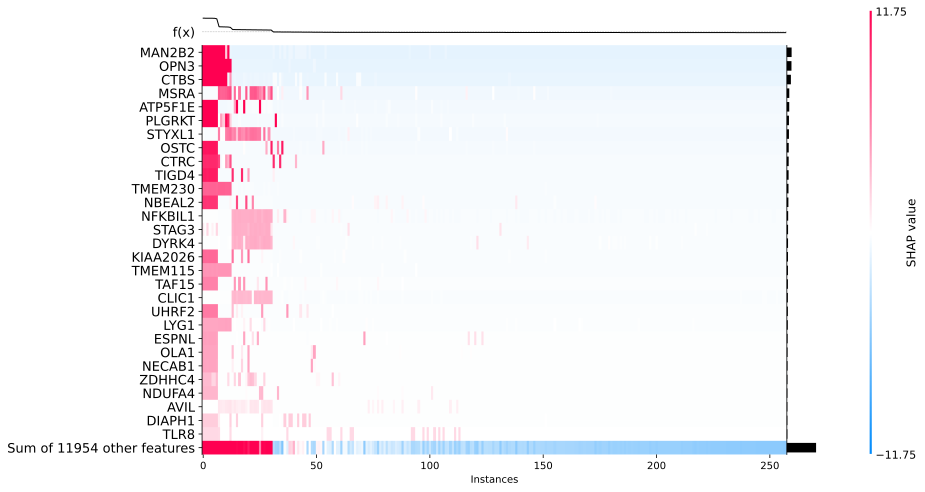

In [21]:
stage_one_mass_heatmap_path = locations.output.plots / "stage_one" / "heatmap_mass_unclustered.svg"
stage_one_mass.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=False, save=stage_one_mass_heatmap_path)

### MtGC ###

In [22]:
stage_one_mtGC = run_stage_one("mtGC")
stage_one_mtGC.selected

2020-10-15 23:35:00.955 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-10-15 23:35:00.956 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10}
2020-10-15 23:35:00.997 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Sus_scrofa']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:03.791 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Gorilla_gorilla']


Early stopping, best iteration is:
[63]	valid_0's l1: 0.441211	valid_0's l2: 0.516391	valid_0's huber: 0.196681
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:06.994 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Equus_caballus']


Early stopping, best iteration is:
[44]	valid_0's l1: 0.666014	valid_0's l2: 0.744224	valid_0's huber: 0.316382
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:10.665 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Ovis_aries']


Early stopping, best iteration is:
[115]	valid_0's l1: 0.489207	valid_0's l2: 0.880688	valid_0's huber: 0.266097
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:13.698 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Capra_hircus', 'Macaca_fascicularis']


Early stopping, best iteration is:
[75]	valid_0's l1: 0.610399	valid_0's l2: 0.813965	valid_0's huber: 0.315184
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[145]	valid_0's l1: 0.432926	valid_0's l2: 0.491019	valid_0's huber: 0.195021


2020-10-15 23:35:23.419 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9096028424902937, MAE=0.5279515341454875, MSE=0.6892571676741432, huber=0.25789016146700405)
2020-10-15 23:35:23.477 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-10-15 23:35:23.478 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 0}
2020-10-15 23:35:23.521 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Felis_catus']
Found `early_stopping_round` in params. Will use it instead of arg

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:28.095 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 1 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Heterocephalus_glaber']


Early stopping, best iteration is:
[166]	valid_0's l1: 0.337064	valid_0's l2: 0.304221	valid_0's huber: 0.124882
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:31.118 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Sus_scrofa']


Early stopping, best iteration is:
[82]	valid_0's l1: 0.529638	valid_0's l2: 0.690563	valid_0's huber: 0.27286
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:37.712 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Bos_taurus']


Early stopping, best iteration is:
[117]	valid_0's l1: 0.30368	valid_0's l2: 0.301533	valid_0's huber: 0.130421
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:40.682 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Equus_caballus']


Early stopping, best iteration is:
[81]	valid_0's l1: 0.386133	valid_0's l2: 0.32842	valid_0's huber: 0.147184
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[116]	valid_0's l1: 0.551207	valid_0's l2: 1.28332	valid_0's huber: 0.317704


2020-10-15 23:35:51.739 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9259208071509757, MAE=0.4215445078553709, MSE=0.5816107919753601, huber=0.19858414026021534)
2020-10-15 23:35:51.796 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-10-15 23:35:51.797 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 1}
2020-10-15 23:35:51.838 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Sus_scrofa']
Found `early_stopping_round` in params. Will use it instead of 

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:35:57.107 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 1 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Meriones_unguiculatus']


[250]	valid_0's l1: 0.464265	valid_0's l2: 0.450677	valid_0's huber: 0.205338
Did not meet early stopping. Best iteration is:
[250]	valid_0's l1: 0.464265	valid_0's l2: 0.450677	valid_0's huber: 0.205338
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:00.033 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 2 | VALIDATION_SPECIES: ['Felis_catus', 'Capra_hircus']


Early stopping, best iteration is:
[69]	valid_0's l1: 0.628644	valid_0's l2: 0.845603	valid_0's huber: 0.322842
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:04.435 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Equus_caballus', 'Pan_paniscus']


Early stopping, best iteration is:
[202]	valid_0's l1: 0.313176	valid_0's l2: 0.228994	valid_0's huber: 0.109116
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:09.711 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Rattus_norvegicus']


[250]	valid_0's l1: 0.573041	valid_0's l2: 0.783143	valid_0's huber: 0.294711
Did not meet early stopping. Best iteration is:
[248]	valid_0's l1: 0.573039	valid_0's l2: 0.783199	valid_0's huber: 0.294725
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[6]	valid_0's l1: 0.896294	valid_0's l2: 1.98642	valid_0's huber: 0.559482


2020-10-15 23:36:13.958 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8495905023062649, MAE=0.5750837837327339, MSE=0.8589781977807881, huber=0.29184366090278474)
2020-10-15 23:36:14.013 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-10-15 23:36:14.014 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 2}
2020-10-15 23:36:14.058 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Ursus_americanus', 'Phascolarctos_cinereus']
Found `early_stopping_round` in params. Will use it inst

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:17.220 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 1 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Macaca_mulatta']


Early stopping, best iteration is:
[64]	valid_0's l1: 0.631368	valid_0's l2: 0.975982	valid_0's huber: 0.340971
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:19.978 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Gorilla_gorilla']


Early stopping, best iteration is:
[37]	valid_0's l1: 0.939213	valid_0's l2: 2.80595	valid_0's huber: 0.613162
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:23.107 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Ovis_aries']


Early stopping, best iteration is:
[84]	valid_0's l1: 0.654389	valid_0's l2: 1.0303	valid_0's huber: 0.363442
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:24.711 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Felis_catus', 'Tupaia_belangeri']


Early stopping, best iteration is:
[14]	valid_0's l1: 0.797797	valid_0's l2: 0.943134	valid_0's huber: 0.398884
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[100]	valid_0's l1: 0.514115	valid_0's l2: 0.69719	valid_0's huber: 0.262532


2020-10-15 23:36:31.928 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8341894765322853, MAE=0.7073766577382179, MSE=1.2905113294373056, huber=0.3932043860966032)
2020-10-15 23:36:31.984 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-10-15 23:36:31.985 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 3}
2020-10-15 23:36:32.028 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Vombatus_ursinus']
Found `early_stopping_round` in params. Will use it instead

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:35.086 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 1 | VALIDATION_SPECIES: ['Mus_musculus', 'Macaca_nemestrina']


Early stopping, best iteration is:
[90]	valid_0's l1: 0.966295	valid_0's l2: 1.85149	valid_0's huber: 0.608075
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:38.195 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Heterocephalus_glaber']


Early stopping, best iteration is:
[92]	valid_0's l1: 1.11812	valid_0's l2: 2.38526	valid_0's huber: 0.740519
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:41.297 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Capra_hircus', 'Tupaia_belangeri']


Early stopping, best iteration is:
[82]	valid_0's l1: 0.632612	valid_0's l2: 1.11393	valid_0's huber: 0.364855
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:36:44.796 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Equus_caballus', 'Oryctolagus_cuniculus']


Early stopping, best iteration is:
[115]	valid_0's l1: 0.381807	valid_0's l2: 0.456091	valid_0's huber: 0.174989
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[104]	valid_0's l1: 0.45246	valid_0's l2: 0.826432	valid_0's huber: 0.241727


2020-10-15 23:36:56.304 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8206571369840192, MAE=0.710258796243399, MSE=1.3266406260023853, huber=0.4260187211191223)
2020-10-15 23:36:56.358 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-10-15 23:36:56.359 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 4}
2020-10-15 23:36:56.403 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Vombatus_ursinus']
Found `early_stopping_round` in params. Will use it instead of arg

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:01.419 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 1 | VALIDATION_SPECIES: ['Sus_scrofa', 'Rhinolophus_ferrumequinum']


[250]	valid_0's l1: 0.495051	valid_0's l2: 0.717379	valid_0's huber: 0.248336
Did not meet early stopping. Best iteration is:
[249]	valid_0's l1: 0.495049	valid_0's l2: 0.717353	valid_0's huber: 0.248332
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:04.927 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Bos_taurus']


Early stopping, best iteration is:
[117]	valid_0's l1: 0.38329	valid_0's l2: 0.52572	valid_0's huber: 0.184356
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:08.396 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Heterocephalus_glaber']


Early stopping, best iteration is:
[102]	valid_0's l1: 0.449672	valid_0's l2: 0.484819	valid_0's huber: 0.208071
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:11.709 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Equus_caballus']


Early stopping, best iteration is:
[106]	valid_0's l1: 0.522958	valid_0's l2: 0.751042	valid_0's huber: 0.272434
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[133]	valid_0's l1: 0.366709	valid_0's l2: 0.313237	valid_0's huber: 0.140446


2020-10-15 23:37:24.026 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9254032182273864, MAE=0.44353558782810765, MSE=0.5584338989570872, huber=0.21073900029383466)
2020-10-15 23:37:24.084 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-10-15 23:37:24.085 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 5}
2020-10-15 23:37:24.131 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Ursus_americanus', 'Tupaia_belangeri']
Found `early_stopping_round` in params. Will use it instead o

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:27.492 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 1 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[94]	valid_0's l1: 0.557634	valid_0's l2: 0.825282	valid_0's huber: 0.298737
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:32.085 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 2 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Sus_scrofa']


Early stopping, best iteration is:
[174]	valid_0's l1: 0.441261	valid_0's l2: 0.663204	valid_0's huber: 0.211398
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:35.693 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Bos_taurus', 'Ictidomys_tridecemlineatus']


Early stopping, best iteration is:
[120]	valid_0's l1: 0.291525	valid_0's l2: 0.201244	valid_0's huber: 0.0948343
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:37.810 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Felis_catus']


Early stopping, best iteration is:
[27]	valid_0's l1: 0.861738	valid_0's l2: 2.61326	valid_0's huber: 0.519205
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[173]	valid_0's l1: 0.391897	valid_0's l2: 0.366019	valid_0's huber: 0.156606


2020-10-15 23:37:48.156 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8759305464871419, MAE=0.5088110557282627, MSE=0.933801806205896, huber=0.25059788114136666)
2020-10-15 23:37:48.215 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-10-15 23:37:48.215 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 6}
2020-10-15 23:37:48.261 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Sus_scrofa', 'Macaca_fascicularis']
Found `early_stopping_round` in params. Will use it instead of arg

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:52.732 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 1 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Meriones_unguiculatus']


Early stopping, best iteration is:
[155]	valid_0's l1: 0.329073	valid_0's l2: 0.245352	valid_0's huber: 0.116789
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:54.805 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Ovis_aries']


Early stopping, best iteration is:
[26]	valid_0's l1: 1.09618	valid_0's l2: 2.99324	valid_0's huber: 0.70736
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:37:58.286 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Mus_musculus', 'Equus_caballus']


Early stopping, best iteration is:
[108]	valid_0's l1: 0.613027	valid_0's l2: 0.964913	valid_0's huber: 0.315854
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:01.424 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Vombatus_ursinus', 'Heterocephalus_glaber']


Early stopping, best iteration is:
[98]	valid_0's l1: 0.808201	valid_0's l2: 1.13401	valid_0's huber: 0.466514
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[162]	valid_0's l1: 0.514094	valid_0's l2: 0.646242	valid_0's huber: 0.243737


2020-10-15 23:38:11.649 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8350510466239834, MAE=0.6721150491236693, MSE=1.1967503698551947, huber=0.3630795210243526)
2020-10-15 23:38:11.707 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-10-15 23:38:11.708 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 7}
2020-10-15 23:38:11.754 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Ailuropoda_melanoleuca']
Found `early_stopping_round` in params. Will use it instead

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:16.021 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 1 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Tupaia_belangeri']


Early stopping, best iteration is:
[155]	valid_0's l1: 0.500272	valid_0's l2: 0.691785	valid_0's huber: 0.247581
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:18.581 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Mesocricetus_auratus']


Early stopping, best iteration is:
[54]	valid_0's l1: 0.52535	valid_0's l2: 0.61728	valid_0's huber: 0.240626
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:23.505 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Ovis_aries']


[250]	valid_0's l1: 0.785434	valid_0's l2: 1.48332	valid_0's huber: 0.484037
Did not meet early stopping. Best iteration is:
[250]	valid_0's l1: 0.785434	valid_0's l2: 1.48332	valid_0's huber: 0.484037
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:26.575 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Bos_taurus', 'Oryctolagus_cuniculus']


Early stopping, best iteration is:
[79]	valid_0's l1: 0.517472	valid_0's l2: 0.67778	valid_0's huber: 0.260115
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[88]	valid_0's l1: 0.425229	valid_0's l2: 0.472191	valid_0's huber: 0.186385


2020-10-15 23:38:36.307 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8988612190374384, MAE=0.5507513040422383, MSE=0.7884716351808982, huber=0.2837962274946782)
2020-10-15 23:38:36.367 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-10-15 23:38:36.368 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.4882827581871194, 'boosting_type': 'gbdt', 'drop_rate': 0.16290376621758335, 'feature_fraction': 0.3059934876406196, 'lambda_l1': 0.017007142345511594, 'lambda_l2': 0.568546479848152, 'learning_rate': 0.08231879540454069, 'max_depth': 7, 'max_leaves': 24, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 8}
2020-10-15 23:38:36.409 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Meriones_unguiculatus']
Found `early_stopping_round` in params. Will use it inste

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:38.409 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 1 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Pan_troglodytes']


Early stopping, best iteration is:
[31]	valid_0's l1: 0.872133	valid_0's l2: 1.03006	valid_0's huber: 0.447743
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:42.124 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 2 | VALIDATION_SPECIES: ['Ailuropoda_melanoleuca', 'Heterocephalus_glaber']


Early stopping, best iteration is:
[90]	valid_0's l1: 0.673474	valid_0's l2: 1.00705	valid_0's huber: 0.373538
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:45.958 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Cavia_porcellus']


Early stopping, best iteration is:
[123]	valid_0's l1: 0.541871	valid_0's l2: 0.742505	valid_0's huber: 0.282726
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:38:48.328 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Vombatus_ursinus']


Early stopping, best iteration is:
[45]	valid_0's l1: 1.06973	valid_0's l2: 2.0727	valid_0's huber: 0.662302
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[109]	valid_0's l1: 0.700989	valid_0's l2: 1.14192	valid_0's huber: 0.387133


2020-10-15 23:38:56.797 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8274968211218413, MAE=0.7716386027961903, MSE=1.1988455579181634, huber=0.431154932501493)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000171121,KCNMB3,10.000,0.385,0.625,0.579,0.616,0.289,0.615,0.326,0.616,0.439,0.635,0.408,0.641,0.333,0.626,0.268,0.631,0.372,0.618,0.414,0.628,0.425,0.619
ENSG00000144451,SPAG16,10.000,0.140,0.389,0.044,0.471,0.119,0.405,0.182,0.368,0.117,0.319,0.156,0.342,0.144,0.450,0.126,0.384,0.178,0.323,0.194,0.446,0.144,0.380
ENSG00000023191,RNH1,10.000,0.008,-0.466,0.007,-0.571,0.006,-0.483,0.007,-0.422,0.010,-0.476,0.010,-0.531,0.013,-0.413,0.006,-0.425,0.005,-0.441,0.013,-0.443,0.008,-0.450
ENSG00000006282,SPATA20,9.000,0.237,0.694,0.286,0.698,0.244,0.717,0.347,0.697,0.159,0.676,0.156,0.687,0.334,0.695,0.255,0.690,nan,nan,0.214,0.690,0.378,0.694
ENSG00000122034,GTF3A,9.000,0.204,0.627,0.233,0.610,0.269,0.611,nan,nan,0.213,0.606,0.150,0.673,0.271,0.611,0.336,0.597,0.178,0.600,0.198,0.647,0.198,0.690
ENSG00000154328,NEIL2,9.000,0.127,0.693,0.115,0.737,0.164,0.684,nan,nan,0.141,0.659,0.220,0.734,0.129,0.694,0.204,0.692,0.167,0.689,0.069,0.694,0.061,0.652
ENSG00000168300,PCMTD1,8.000,0.120,0.133,0.099,0.198,0.232,0.132,nan,nan,0.111,0.168,0.173,0.063,0.154,0.146,0.200,0.103,0.138,0.132,0.092,0.117,nan,nan
ENSG00000188747,NOXA1,8.000,0.047,0.649,0.021,0.728,0.104,0.660,nan,nan,0.068,0.621,0.019,0.700,0.054,0.562,nan,nan,0.033,0.614,0.056,0.612,0.118,0.695
ENSG00000167272,POP5,8.000,0.041,-0.359,0.059,-0.336,0.053,-0.335,nan,nan,nan,nan,0.077,-0.376,0.026,-0.361,0.059,-0.379,0.073,-0.364,0.025,-0.385,0.038,-0.335
ENSG00000196419,XRCC6,7.000,0.169,0.542,0.193,0.617,0.243,0.567,0.286,0.614,0.249,0.318,0.217,0.581,0.175,0.540,nan,nan,nan,nan,0.328,0.553,nan,nan


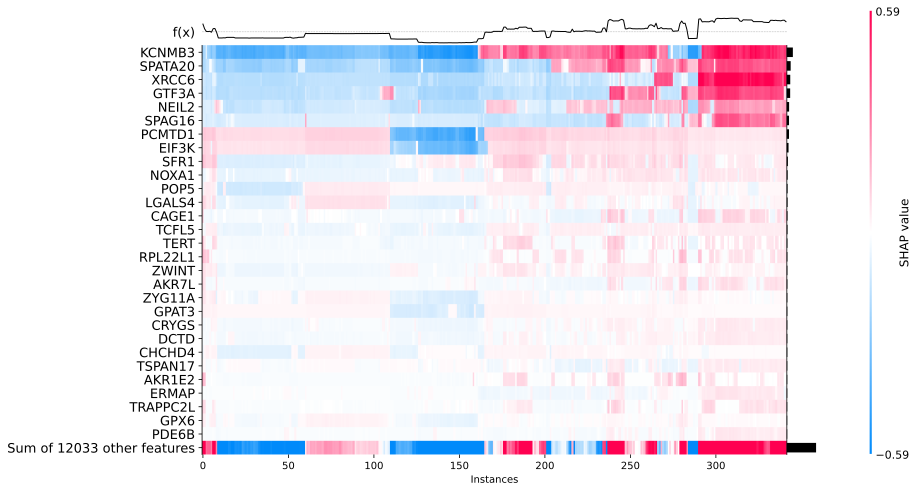

In [23]:
stage_one_gc_heatmap_path = locations.output.plots / "stage_one" / "heatmap_gc.svg"
stage_one_mtGC.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=True, save=stage_one_gc_heatmap_path)

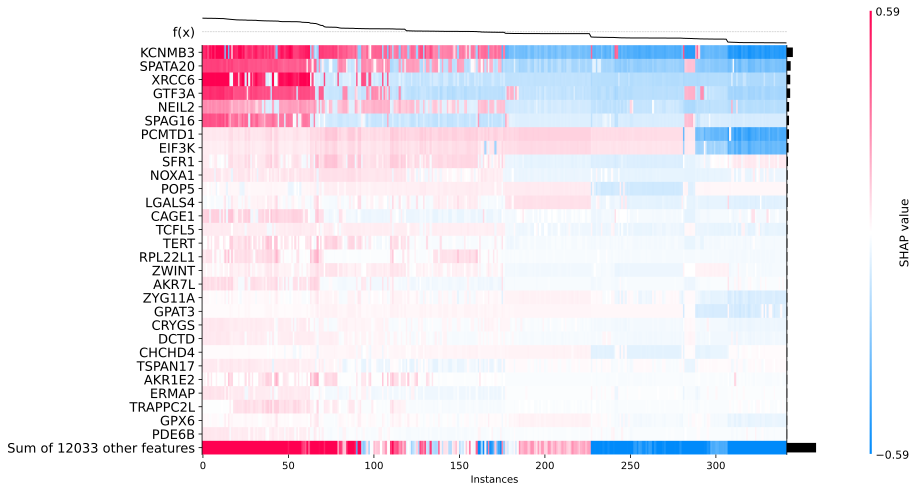

In [24]:
stage_one_gc_heatmap_unclustered_path = locations.output.plots / "stage_one" / "heatmap_gc_unclustered.svg"
stage_one_mtGC.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=False, save=stage_one_gc_heatmap_unclustered_path)

### Metabolism ###

In [25]:
stage_one_metabolic_rate = run_stage_one("metabolic_rate")
stage_one_metabolic_rate.selected

2020-10-15 23:39:06.125 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-10-15 23:39:06.126 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10}
2020-10-15 23:39:06.156 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Cavia_porcellus']
Found `early_stopping_round` in params. Will use it instead of argument
Early stopping is not available in dart mode
2020-10-15 23:39:10.715 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Sus_scrofa', 'Phascolarctos_cinereus'

[250]	valid_0's l1: 17.5139	valid_0's l2: 754.246	valid_0's huber: 15.4045


2020-10-15 23:39:16.587 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 2 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Rattus_norvegicus']


[250]	valid_0's l1: 19.4395	valid_0's l2: 1228.27	valid_0's huber: 17.1873


2020-10-15 23:39:21.321 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Oryctolagus_cuniculus']


[250]	valid_0's l1: 8.94619	valid_0's l2: 361.794	valid_0's huber: 7.70051


2020-10-15 23:39:26.802 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Suricata_suricatta']


[250]	valid_0's l1: 20.8202	valid_0's l2: 953.046	valid_0's huber: 18.4148
[250]	valid_0's l1: 20.0585	valid_0's l2: 1793.73	valid_0's huber: 17.7813


2020-10-15 23:39:35.959 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.691143306477073, MAE=17.355635509911824, MSE=1018.2182647384634, huber=15.297711271357446)
2020-10-15 23:39:36.005 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-10-15 23:39:36.006 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 0}
2020-10-15 23:39:36.035 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Meriones_unguiculatus']
Found `early_stopping_round` in params. Will use it instead of

[250]	valid_0's l1: 17.5895	valid_0's l2: 595.834	valid_0's huber: 15.4545


2020-10-15 23:39:46.540 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Sus_scrofa']


[250]	valid_0's l1: 20.1027	valid_0's l2: 743.564	valid_0's huber: 17.7127


2020-10-15 23:39:53.205 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Rattus_norvegicus']


[250]	valid_0's l1: 27.3702	valid_0's l2: 1384.26	valid_0's huber: 24.2603


2020-10-15 23:39:57.654 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Mus_musculus', 'Suricata_suricatta']


[250]	valid_0's l1: 19.9085	valid_0's l2: 1106.06	valid_0's huber: 17.5261
[250]	valid_0's l1: 11.0891	valid_0's l2: 757.955	valid_0's huber: 9.61949


2020-10-15 23:40:05.925 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.6861459387014753, MAE=19.21201402027892, MSE=917.5353185695109, huber=16.914635155143554)
2020-10-15 23:40:05.973 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-10-15 23:40:05.974 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 1}
2020-10-15 23:40:06.005 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Mus_musculus']
Found `early_stopping_round` in params. Will use it instead o

[250]	valid_0's l1: 3.49918	valid_0's l2: 129.843	valid_0's huber: 2.80094


2020-10-15 23:40:17.188 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 2 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Rattus_norvegicus']


[250]	valid_0's l1: 12.1202	valid_0's l2: 311.529	valid_0's huber: 10.5645


2020-10-15 23:40:21.275 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Cavia_porcellus']


[250]	valid_0's l1: 9.28808	valid_0's l2: 489.037	valid_0's huber: 8.01447


2020-10-15 23:40:26.318 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Otolemur_garnettii']


[250]	valid_0's l1: 28.352	valid_0's l2: 1999.34	valid_0's huber: 25.1239
[250]	valid_0's l1: 8.05001	valid_0's l2: 147.694	valid_0's huber: 6.87005


2020-10-15 23:40:35.364 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7642307941441079, MAE=12.261895020738365, MSE=615.4879188717357, huber=10.674775880933234)
2020-10-15 23:40:35.411 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-10-15 23:40:35.412 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 2}
2020-10-15 23:40:35.441 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Ictidomys_tridecemlineatus']
Found `early_stopping_round` in params. Will use it 

[250]	valid_0's l1: 7.21366	valid_0's l2: 227.291	valid_0's huber: 6.11799


2020-10-15 23:40:47.464 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Sus_scrofa', 'Cavia_porcellus']


[250]	valid_0's l1: 16.2265	valid_0's l2: 567.971	valid_0's huber: 14.2476


2020-10-15 23:40:53.092 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Mus_musculus', 'Meriones_unguiculatus']


[250]	valid_0's l1: 17.1074	valid_0's l2: 931.067	valid_0's huber: 15.0004


2020-10-15 23:40:58.475 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Suricata_suricatta']


[250]	valid_0's l1: 12.2597	valid_0's l2: 348.261	valid_0's huber: 10.6454
[250]	valid_0's l1: 7.7893	valid_0's l2: 368.466	valid_0's huber: 6.65181


2020-10-15 23:41:08.169 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8268505504115703, MAE=12.119310541866852, MSE=488.6113638517101, huber=10.532634237912946)
2020-10-15 23:41:08.217 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-10-15 23:41:08.218 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 3}
2020-10-15 23:41:08.247 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Rattus_norvegicus']
Found `early_stopping_round` in params. Will use it instead o

[250]	valid_0's l1: 5.36491	valid_0's l2: 169.578	valid_0's huber: 4.46634


2020-10-15 23:41:18.199 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Oryctolagus_cuniculus']


[250]	valid_0's l1: 29.7997	valid_0's l2: 2031.72	valid_0's huber: 26.4274


2020-10-15 23:41:23.869 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Monodelphis_domestica']


[250]	valid_0's l1: 27.2341	valid_0's l2: 1282	valid_0's huber: 24.1627


2020-10-15 23:41:29.020 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Mus_musculus', 'Otolemur_garnettii']


[250]	valid_0's l1: 13.6714	valid_0's l2: 587.55	valid_0's huber: 11.9166
[250]	valid_0's l1: 4.24564	valid_0's l2: 70.0512	valid_0's huber: 3.49949


2020-10-15 23:41:37.382 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7664353288020107, MAE=16.063162507569576, MSE=828.1790988722996, huber=14.094498628930467)
2020-10-15 23:41:37.430 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-10-15 23:41:37.431 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 4}
2020-10-15 23:41:37.460 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Mus_musculus']
Found `early_stopping_round` in params. Will use it instead of a

[250]	valid_0's l1: 9.56976	valid_0's l2: 193.769	valid_0's huber: 8.24905


2020-10-15 23:41:48.647 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Ictidomys_tridecemlineatus']


[250]	valid_0's l1: 25.0453	valid_0's l2: 1497.12	valid_0's huber: 22.1797


2020-10-15 23:41:54.307 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Rattus_norvegicus']


[250]	valid_0's l1: 13.0473	valid_0's l2: 700.202	valid_0's huber: 11.3977


2020-10-15 23:41:59.124 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Monodelphis_domestica']


[250]	valid_0's l1: 4.45458	valid_0's l2: 107.382	valid_0's huber: 3.68894
[250]	valid_0's l1: 16.6817	valid_0's l2: 557.571	valid_0's huber: 14.6276


2020-10-15 23:42:06.883 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8252072057207196, MAE=13.75974868494167, MSE=611.2081564894063, huber=12.028581824639625)
2020-10-15 23:42:06.927 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-10-15 23:42:06.928 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 5}
2020-10-15 23:42:06.959 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Callithrix_jacchus']
Found `early_stopping_round` in params. Will use it instead o

[250]	valid_0's l1: 7.33671	valid_0's l2: 287.967	valid_0's huber: 6.31027


2020-10-15 23:42:17.682 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 2 | VALIDATION_SPECIES: ['Mus_musculus', 'Sus_scrofa']


[250]	valid_0's l1: 5.36153	valid_0's l2: 145.057	valid_0's huber: 4.49205


2020-10-15 23:42:22.620 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Meriones_unguiculatus']


[250]	valid_0's l1: 5.70539	valid_0's l2: 213.123	valid_0's huber: 4.85708


2020-10-15 23:42:27.694 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Ictidomys_tridecemlineatus']


[250]	valid_0's l1: 32.0746	valid_0's l2: 2039.26	valid_0's huber: 28.4886
[250]	valid_0's l1: 9.96712	valid_0's l2: 331.649	valid_0's huber: 8.6318


2020-10-15 23:42:35.374 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7786788079304712, MAE=12.089074056028268, MSE=603.4113586160717, huber=10.555953074677973)
2020-10-15 23:42:35.421 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-10-15 23:42:35.422 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 6}
2020-10-15 23:42:35.453 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Callithrix_jacchus']
Found `early_stopping_round` in params. Will use it instead of

[250]	valid_0's l1: 12.5842	valid_0's l2: 516.492	valid_0's huber: 11.0116


2020-10-15 23:42:47.073 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 2 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Monodelphis_domestica']


[250]	valid_0's l1: 12.2688	valid_0's l2: 577.751	valid_0's huber: 10.6714


2020-10-15 23:42:50.685 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Mesocricetus_auratus']


[250]	valid_0's l1: 8.19737	valid_0's l2: 294.221	valid_0's huber: 7.0335


2020-10-15 23:42:55.754 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Sus_scrofa', 'Meriones_unguiculatus']


[250]	valid_0's l1: 13.1325	valid_0's l2: 389.398	valid_0's huber: 11.4901
[250]	valid_0's l1: 12.6796	valid_0's l2: 754.309	valid_0's huber: 11.1387


2020-10-15 23:43:03.545 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8331175921980675, MAE=11.77251831241475, MSE=506.43422313405665, huber=10.269055256971594)
2020-10-15 23:43:03.594 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-10-15 23:43:03.596 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 7}
2020-10-15 23:43:03.628 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Otolemur_garnettii']
Found `early_stopping_round` in params. Will use it instea

[250]	valid_0's l1: 9.81667	valid_0's l2: 466.884	valid_0's huber: 8.5133


2020-10-15 23:43:23.088 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Mesocricetus_auratus']


[250]	valid_0's l1: 33.8404	valid_0's l2: 2191.86	valid_0's huber: 30.0952


2020-10-15 23:43:27.836 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Sus_scrofa']


[250]	valid_0's l1: 8.62828	valid_0's l2: 357.689	valid_0's huber: 7.43035


2020-10-15 23:43:33.612 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Mus_musculus', 'Monodelphis_domestica']


[250]	valid_0's l1: 15.7891	valid_0's l2: 562.924	valid_0's huber: 13.9279
[250]	valid_0's l1: 5.5524	valid_0's l2: 228.758	valid_0's huber: 4.64125


2020-10-15 23:43:40.340 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7712352395466965, MAE=14.725377971454353, MSE=761.6221203873226, huber=12.921598656804909)
2020-10-15 23:43:40.388 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-10-15 23:43:40.389 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.7949279232062532, 'boosting_type': 'dart', 'drop_rate': 0.19407161947050122, 'feature_fraction': 0.8486129005166576, 'lambda_l1': 2.9464767054398204, 'lambda_l2': 0.817423041659147, 'learning_rate': 0.08579903520990408, 'max_depth': 7, 'max_leaves': 15, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 8}
2020-10-15 23:43:40.419 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Cavia_porcellus']
Found `early_stopping_round` in params. Will use it instead of

[250]	valid_0's l1: 17.4503	valid_0's l2: 838.407	valid_0's huber: 15.3416


2020-10-15 23:43:50.884 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 2 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Mus_musculus']


[250]	valid_0's l1: 9.96254	valid_0's l2: 299.298	valid_0's huber: 8.62191


2020-10-15 23:43:55.393 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Otolemur_garnettii']


[250]	valid_0's l1: 11.3929	valid_0's l2: 510.647	valid_0's huber: 9.89837


2020-10-15 23:44:01.374 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Sus_scrofa']


[250]	valid_0's l1: 30.1299	valid_0's l2: 1883.47	valid_0's huber: 26.7727
[250]	valid_0's l1: 12.1394	valid_0's l2: 284.812	valid_0's huber: 10.6148


2020-10-15 23:44:10.738 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7144345722914076, MAE=16.215000298165734, MSE=763.3265955588693, huber=14.249872590228245)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000171747,LGALS4,8.000,0.026,-0.695,0.055,-0.636,nan,nan,0.020,-0.720,0.017,-0.723,0.021,-0.690,0.038,-0.685,0.024,-0.699,0.046,-0.725,nan,nan,0.034,-0.679
ENSG00000134825,TMEM258,7.000,0.013,0.646,nan,nan,0.032,0.687,nan,nan,nan,nan,0.017,0.678,0.010,0.551,0.020,0.688,0.023,0.619,0.019,0.671,0.007,0.630
ENSG00000164182,NDUFAF2,7.000,0.005,-0.696,0.007,-0.766,0.011,-0.653,nan,nan,0.003,-0.737,0.008,-0.694,nan,nan,0.006,-0.648,0.004,-0.717,nan,nan,0.007,-0.658
ENSG00000127952,STYXL1,6.000,0.902,0.312,nan,nan,0.794,0.420,1.631,0.217,1.110,0.283,2.061,0.353,2.042,0.205,nan,nan,nan,nan,nan,nan,1.378,0.396
ENSG00000108384,RAD51C,6.000,0.035,0.372,0.042,0.468,0.021,0.420,nan,nan,0.056,0.191,nan,nan,0.103,0.356,0.087,0.476,nan,nan,nan,nan,0.046,0.318
ENSG00000198663,C6orf89,6.000,0.005,-0.567,nan,nan,nan,nan,0.016,-0.602,0.007,-0.592,nan,nan,0.005,-0.623,0.003,-0.500,0.006,-0.537,nan,nan,0.009,-0.551
ENSG00000107020,PLGRKT,5.000,1.001,0.049,nan,nan,nan,nan,1.880,-0.083,1.603,0.220,3.242,0.144,nan,nan,1.789,0.063,nan,nan,nan,nan,1.500,-0.099
ENSG00000124172,ATP5F1E,5.000,0.646,-0.247,1.477,-0.225,nan,nan,nan,nan,1.720,-0.311,1.257,-0.226,nan,nan,nan,nan,1.211,-0.215,0.790,-0.257,nan,nan
ENSG00000175806,MSRA,4.000,0.640,-0.048,2.182,-0.130,1.314,0.046,1.509,-0.130,1.393,0.022,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ENSG00000270647,TAF15,4.000,0.461,0.046,nan,nan,nan,nan,1.185,0.141,1.285,-0.029,nan,nan,1.325,0.014,nan,nan,nan,nan,0.820,0.057,nan,nan


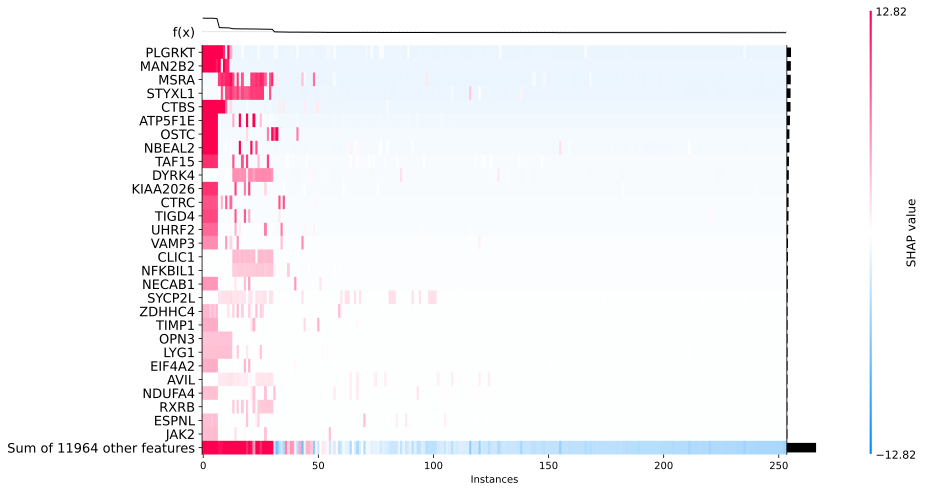

In [26]:
stage_one_metabolic_rate_heatmap_path = locations.output.plots / "stage_one" / "heatmap_metabolic_rate_unclustered.svg"
stage_one_metabolic_rate.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=False, save=stage_one_metabolic_rate_heatmap_path)

### Temperature ###

In [27]:
stage_one_temperature = run_stage_one("temperature")
stage_one_temperature.selected

2020-10-15 23:44:18.376 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-10-15 23:44:18.377 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber']}
2020-10-15 23:44:18.418 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Suricata_suricatta']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.326076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 855191
[LightGBM] [Info] Number of data points in the train set: 234, number of used features: 12044
[LightGBM] [Info] Start training from score 36.870085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

Early stopping is not available in dart mode


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

2020-10-15 23:44:20.615 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Cavia_porcellus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

2020-10-15 23:44:22.803 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 2 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Mesocricetus_auratus']



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no

2020-10-15 23:44:25.043 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Bos_taurus', 'Ictidomys_tridecemlineatus']


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there

2020-10-15 23:44:27.446 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Ovis_aries']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:44:33.082 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-439.4440127139067, MAE=40.99778116574721, MSE=1704.8448607644968, huber=0.9176959676703518)
2020-10-15 23:44:33.135 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-10-15 23:44:33.136 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 0}
2020-10-15 23:44:33.178 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Equus_caballus', 'Macaca_mulatta']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.370643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1005940
[LightGBM] [Info] Number of data points in the train set: 277, number of used features: 12044
[LightGBM] [Info] Start training from score 36.893140
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

Early stopping is not available in dart mode


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there

2020-10-15 23:44:35.346 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 1 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Felis_catus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[250]	valid_0's l1: 41.6214	valid_0's l2: 1734.55	valid_0's huber: 37.0542
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.310705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 816497
[LightGBM] [Info] Number of data points in the train set: 223, number of used features: 12043
[LightGBM] [Info] Start training from score 36.808968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2020-10-15 23:44:37.291 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Bos_taurus', 'Suricata_suricatta']


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there

2020-10-15 23:44:39.467 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Callithrix_jacchus']


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

2020-10-15 23:44:41.880 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Mesocricetus_auratus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[250]	valid_0's l1: 40.4653	valid_0's l2: 1638.82	valid_0's huber: 36.0138
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.356417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 948211
[LightGBM] [Info] Number of data points in the train set: 259, number of used features: 12044
[LightGBM] [Info] Start training from score 36.762162
[LightGBM] [Warning] No further splits 

2020-10-15 23:44:46.818 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-328.86266217765757, MAE=31.74990543499041, MSE=1069.0774106663168, huber=0.9625845567507072)
2020-10-15 23:44:46.874 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-10-15 23:44:46.875 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 1}
2020-10-15 23:44:46.919 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Felis_catus', 'Suricata_suricatta']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.378709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 963338
[LightGBM] [Info] Number of data points in the train set: 265, number of used features: 12044
[LightGBM] [Info] Start training from score 36.675094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

Early stopping is not available in dart mode


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet

2020-10-15 23:44:49.139 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 1 | VALIDATION_SPECIES: ['Homo_sapiens', 'Monodelphis_domestica']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

2020-10-15 23:44:54.922 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Phascolarctos_cinereus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l1: 36.3645	valid_0's l2: 1327.36	valid_0's huber: 32.3231
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.365885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986357
[LightGBM] [Info] Number of data points in the train set: 271, number of used features: 12045
[LightGBM] [Info] Start training from score 36.734686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

2020-10-15 23:44:57.235 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Sus_scrofa']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.351690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 938238
[LightGBM] [Info] Number of data points in the train set: 256, number of used features: 12044
[LightGBM] [Info] Start training from score 36.564843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

2020-10-15 23:44:59.393 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Gorilla_gorilla']



[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


2020-10-15 23:45:05.161 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-673.7298929577446, MAE=36.58352731569516, MSE=1356.3049729953734, huber=0.8886453872789687)
2020-10-15 23:45:05.216 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-10-15 23:45:05.217 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 2}
2020-10-15 23:45:05.259 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Tupaia_belangeri']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.352847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 948824
[LightGBM] [Info] Number of data points in the train set: 260, number of used features: 12043
[LightGBM] [Info] Start training from score 36.804615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain

Early stopping is not available in dart mode


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

2020-10-15 23:45:07.686 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 1 | VALIDATION_SPECIES: ['Felis_catus', 'Cavia_porcellus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

2020-10-15 23:45:10.021 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Ictidomys_tridecemlineatus']


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

2020-10-15 23:45:12.718 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Bos_taurus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

2020-10-15 23:45:15.117 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Meriones_unguiculatus', 'Pan_troglodytes']


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

2020-10-15 23:45:20.976 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-350.53862939784125, MAE=35.19975602148139, MSE=1267.3365969022875, huber=0.9078739714065345)
2020-10-15 23:45:21.030 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-10-15 23:45:21.031 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 3}
2020-10-15 23:45:21.070 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Mus_musculus', 'Equus_caballus']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.360218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 928711
[LightGBM] [Info] Number of data points in the train set: 256, number of used features: 12044
[LightGBM] [Info] Start training from score 36.872265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] N

Early stopping is not available in dart mode


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

2020-10-15 23:45:23.672 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 1 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Felis_catus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[250]	valid_0's l1: 35.8717	valid_0's l2: 1288.26	valid_0's huber: 31.8795
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.366974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 990121
[LightGBM] [Info] Number of data points in the train set: 272, number of used features: 12043
[LightGBM] [Info] Start training from score 36.784191
[LightGBM] [Warning] No further splits 

2020-10-15 23:45:26.136 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Bos_taurus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

2020-10-15 23:45:32.009 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Homo_sapiens']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[250]	valid_0's l1: 35.2492	valid_0's l2: 1244.03	valid_0's huber: 31.3192
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.497116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 931899
[LightGBM] [Info] Number of data points in the train set: 254, number of used features: 12044
[LightGBM] [Info] Start training from score 36.783464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2020-10-15 23:45:34.998 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Ovis_aries', 'Rattus_norvegicus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:45:41.141 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-310.8456182819167, MAE=34.21376265428484, MSE=1216.7429411436337, huber=0.9593875703888877)
2020-10-15 23:45:41.193 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-10-15 23:45:41.194 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 4}
2020-10-15 23:45:41.235 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Mus_musculus']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.341224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 896409
[LightGBM] [Info] Number of data points in the train set: 246, number of used features: 12043
[LightGBM] [Info] Start training from score 36.706503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] N

Early stopping is not available in dart mode


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet

2020-10-15 23:45:43.658 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 1 | VALIDATION_SPECIES: ['Suricata_suricatta', 'Meriones_unguiculatus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[250]	valid_0's l1: 37.9462	valid_0's l2: 1440.91	valid_0's huber: 33.7466
[LightGBM] [W

2020-10-15 23:45:45.814 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Callithrix_jacchus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:45:47.789 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Bos_taurus', 'Felis_catus']


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves 

2020-10-15 23:45:50.108 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Ovis_aries', 'Mesocricetus_auratus']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.354419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 945548
[LightGBM] [Info] Number of data points in the train set: 258, number of used features: 12044
[LightGBM] [Info] Start training from score 36.605814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] N

2020-10-15 23:45:54.860 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-604.062579292549, MAE=35.98813747590755, MSE=1364.3424368799242, huber=1.00444210330759)
2020-10-15 23:45:54.910 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-10-15 23:45:54.911 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 5}
2020-10-15 23:45:54.950 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Bos_taurus']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.359886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 960661
[LightGBM] [Info] Number of data points in the train set: 264, number of used features: 12043
[LightGBM] [Info] Start training from score 36.786742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requir

Early stopping is not available in dart mode


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there

2020-10-15 23:45:57.070 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 1 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Pan_troglodytes']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.360490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 970399
[LightGBM] [Info] Number of data points in the train set: 266, number of used features: 12043
[LightGBM] [Info] Start training from score 36.815037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requir

2020-10-15 23:45:59.705 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 2 | VALIDATION_SPECIES: ['Homo_sapiens', 'Suricata_suricatta']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.356253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 954551
[LightGBM] [Info] Number of data points in the train set: 263, number of used features: 12044
[LightGBM] [Info] Start training from score 36.849809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requir

2020-10-15 23:46:01.889 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Oryctolagus_cuniculus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l1: 30.621	valid_0's l2: 938.782	valid_0's huber: 27.1539
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.357708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 977881
[LightGBM] [Info] Number of data points in the train set: 268, number of used features: 12044
[LightGBM] [Info] Start training from score 36.806343
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

2020-10-15 23:46:04.314 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Rattus_norvegicus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

2020-10-15 23:46:09.869 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-242.72639887029436, MAE=30.73814589268821, MSE=964.121027805166, huber=0.9281274390720465)
2020-10-15 23:46:09.923 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-10-15 23:46:09.924 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 6}
2020-10-15 23:46:09.966 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Suricata_suricatta', 'Ovis_aries']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.361618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 984241
[LightGBM] [Info] Number of data points in the train set: 270, number of used features: 12043
[LightGBM] [Info] Start training from score 36.700000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

Early stopping is not available in dart mode


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positiv

2020-10-15 23:46:12.187 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 1 | VALIDATION_SPECIES: ['Monodelphis_domestica', 'Tupaia_belangeri']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:46:14.508 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 2 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Mesocricetus_auratus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l1: 37.6161	valid_0's l2: 1422.55	valid_0's huber: 33.4495
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.354677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 956506
[LightGBM] [Info] Number of data points in the train set: 262, number of used features: 12044
[LightGBM] [Info] Start traini

2020-10-15 23:46:16.731 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Mus_musculus', 'Felis_catus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

2020-10-15 23:46:18.913 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Meriones_unguiculatus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

2020-10-15 23:46:23.659 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-771.5910249608468, MAE=36.783521531020554, MSE=1384.6887828708136, huber=0.9458736043994547)
2020-10-15 23:46:23.711 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-10-15 23:46:23.712 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 7}
2020-10-15 23:46:23.749 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Pan_troglodytes']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.350707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 943818
[LightGBM] [Info] Number of data points in the train set: 258, number of used features: 12044
[LightGBM] [Info] Start training from score 36.785271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

Early stopping is not available in dart mode


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:46:26.002 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 1 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Bos_taurus']


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet

2020-10-15 23:46:28.185 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Equus_caballus', 'Felis_catus']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:46:30.451 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Callithrix_jacchus']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.353074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 953022
[LightGBM] [Info] Number of data points in the train set: 261, number of used features: 12044
[LightGBM] [Info] Start training from score 36.857088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

2020-10-15 23:46:32.739 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Homo_sapiens', 'Gorilla_gorilla']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.334875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 895199
[LightGBM] [Info] Number of data points in the train set: 246, number of used features: 12042
[LightGBM] [Info] Start training from score 36.883739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

2020-10-15 23:46:38.600 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-394.53386967771047, MAE=37.79825092705298, MSE=1473.9693868114246, huber=0.8894386881852474)
2020-10-15 23:46:38.655 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-10-15 23:46:38.656 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9522534844058304, 'boosting_type': 'dart', 'objective': 'regression', 'feature_fraction': 0.42236910941558053, 'lambda_l1': 0.020847266580277746, 'lambda_l2': 2.8448564854773326, 'learning_rate': 0.11484015430016059, 'max_depth': 3, 'max_leaves': 35, 'min_data_in_leaf': 9, 'num_iterations': 250, 'metrics': ['l1', 'l2', 'huber'], 'seed': 8}
2020-10-15 23:46:38.695 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Monodelphis_domestica']
Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.336765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 909864
[LightGBM] [Info] Number of data points in the train set: 248, number of used features: 12043
[LightGBM] [Info] Start training from score 37.415322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

Early stopping is not available in dart mode


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:46:41.595 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 1 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Pan_troglodytes']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.382444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1032485
[LightGBM] [Info] Number of data points in the train set: 284, number of used features: 12044
[LightGBM] [Info] Start training from score 36.752112
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

2020-10-15 23:46:43.808 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 2 | VALIDATION_SPECIES: ['Felis_catus', 'Otolemur_garnettii']


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

2020-10-15 23:46:46.190 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Mus_musculus']


Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

2020-10-15 23:46:48.281 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Rattus_norvegicus']


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.334041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 872366
[LightGBM] [Info] Number of data points in the train set: 238, number of used features: 12043
[LightGBM] [Info] Start training from score 36.672689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

2020-10-15 23:46:52.492 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=-623.0282745139632, MAE=33.75930903903953, MSE=1215.2815598393759, huber=1.0312719430890451)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000087460,GNAS,10.000,0.121,0.311,0.121,0.381,0.116,0.319,0.172,0.251,0.154,0.275,0.129,0.265,0.073,0.258,0.132,0.375,0.075,0.358,0.169,0.240,0.069,0.387
ENSG00000136942,RPL35,10.000,0.019,-0.441,0.012,0.006,0.014,-0.469,0.019,-0.487,0.011,-0.182,0.015,-0.511,0.017,-0.685,0.024,-0.664,0.027,-0.243,0.022,-0.509,0.025,-0.667
ENSG00000134717,BTF3L4,9.000,0.025,0.337,0.030,0.519,0.038,0.418,0.038,0.483,0.011,0.525,0.034,0.249,0.021,-0.442,0.032,0.452,nan,nan,0.015,0.268,0.029,0.557
ENSG00000173890,GPR160,8.000,0.011,-0.091,nan,nan,0.019,-0.267,0.016,0.626,0.009,-0.626,0.015,-0.009,0.019,-0.620,0.016,0.445,nan,nan,0.008,0.227,0.010,-0.502
ENSG00000126953,TIMM8A,7.000,0.025,0.416,0.032,0.428,0.031,0.200,0.043,-0.003,0.024,0.724,0.035,0.396,nan,nan,0.049,0.462,nan,nan,0.031,0.708,nan,nan
ENSG00000120656,TAF12,6.000,0.031,0.304,0.040,0.496,0.038,-0.079,nan,nan,0.037,0.461,0.060,0.370,nan,nan,0.088,0.142,nan,nan,0.048,0.431,nan,nan
ENSG00000156467,UQCRB,6.000,0.009,-0.151,nan,nan,nan,nan,0.025,-0.284,nan,nan,0.009,-0.159,0.007,0.221,0.016,-0.217,0.017,-0.307,0.016,-0.162,nan,nan
ENSG00000127184,COX7C,6.000,0.008,-0.318,0.016,-0.375,0.012,0.629,nan,nan,0.012,-0.599,0.012,-0.583,nan,nan,0.015,-0.580,nan,nan,0.017,-0.400,nan,nan
ENSG00000187840,EIF4EBP1,6.000,0.006,0.093,0.008,0.104,0.009,-0.024,0.013,-0.026,0.011,0.225,0.009,0.133,nan,nan,nan,nan,nan,nan,nan,nan,0.009,0.143
ENSG00000117450,PRDX1,5.000,0.020,0.209,0.041,0.406,nan,nan,nan,nan,0.045,0.230,0.024,-0.241,nan,nan,0.039,0.449,nan,nan,0.050,0.203,nan,nan


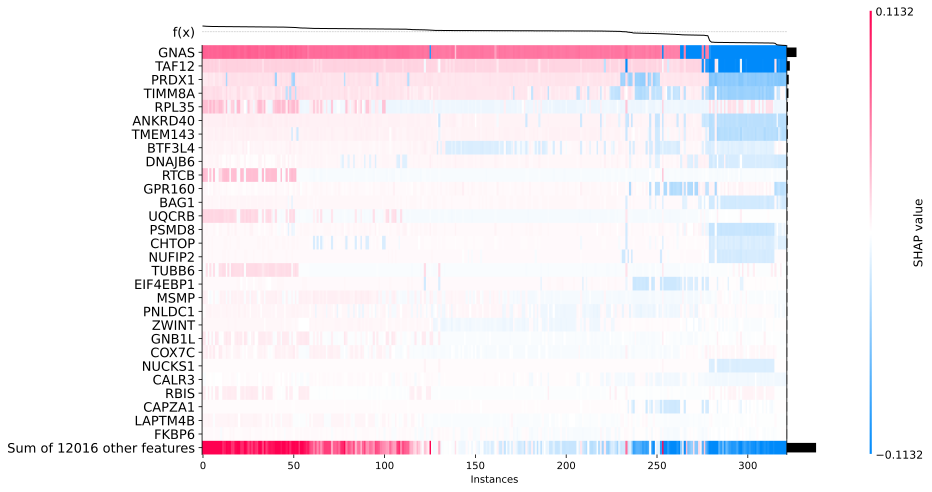

In [28]:
stage_one_temperature_heatmap_path = locations.output.plots / "stage_one" / "heatmap_temperature_unclustered.svg"
stage_one_temperature.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=False, save=stage_one_temperature_heatmap_path)

### Gestation ###

In [29]:
stage_one_gestation = run_stage_one("gestation_days")
stage_one_gestation.selected

2020-10-15 23:46:59.208 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-10-15 23:46:59.209 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10}
2020-10-15 23:46:59.263 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Homo_sapiens', 'Pan_paniscus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:02.434 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Capra_hircus', 'Cavia_porcellus']


Early stopping, best iteration is:
[189]	valid_0's l1: 45.2557	valid_0's l2: 5996.11	valid_0's huber: 40.3688
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:04.741 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 2 | VALIDATION_SPECIES: ['Cavia_aperea', 'Microcebus_murinus']


Early stopping, best iteration is:
[98]	valid_0's l1: 15.3133	valid_0's l2: 761.301	valid_0's huber: 13.4038
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:06.704 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Rhinopithecus_bieti', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[38]	valid_0's l1: 21.0049	valid_0's l2: 1004.24	valid_0's huber: 18.5053
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:09.800 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Aotus_nancymaae', 'Bos_taurus']


Early stopping, best iteration is:
[149]	valid_0's l1: 10.9131	valid_0's l2: 443.722	valid_0's huber: 9.446
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[157]	valid_0's l1: 21.0314	valid_0's l2: 2150.18	valid_0's huber: 18.5563


2020-10-15 23:47:18.674 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7380589537254065, MAE=22.70367224812931, MSE=2071.11079124128, huber=20.04906921387394)
2020-10-15 23:47:18.752 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-10-15 23:47:18.753 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 0}
2020-10-15 23:47:18.806 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Aotus_nancymaae', 'Macaca_mulatta']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:21.993 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 1 | VALIDATION_SPECIES: ['Capra_hircus', 'Callithrix_jacchus']


Early stopping, best iteration is:
[183]	valid_0's l1: 11.8581	valid_0's l2: 526.144	valid_0's huber: 10.3081
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:24.588 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Rhinolophus_ferrumequinum']


Early stopping, best iteration is:
[118]	valid_0's l1: 11.9706	valid_0's l2: 470.939	valid_0's huber: 10.4134
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:28.537 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Suricata_suricatta']


[250]	valid_0's l1: 11.5362	valid_0's l2: 347.987	valid_0's huber: 10.0203
Did not meet early stopping. Best iteration is:
[249]	valid_0's l1: 11.5359	valid_0's l2: 347.975	valid_0's huber: 10.0201
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:31.069 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Bos_taurus', 'Macaca_fascicularis']


Early stopping, best iteration is:
[108]	valid_0's l1: 33.4344	valid_0's l2: 4373.39	valid_0's huber: 29.73
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[72]	valid_0's l1: 22.3007	valid_0's l2: 2319.86	valid_0's huber: 19.6907


2020-10-15 23:47:39.954 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8085553692879085, MAE=18.219932422769222, MSE=1607.6629190546525, huber=16.016355570156037)
2020-10-15 23:47:40.037 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-10-15 23:47:40.038 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 1}
2020-10-15 23:47:40.090 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Macaca_mulatta']
Found `early_stopping_round` in params. Will use it instead

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:42.928 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 1 | VALIDATION_SPECIES: ['Canis_lupus_familiaris', 'Ursus_americanus']


Early stopping, best iteration is:
[132]	valid_0's l1: 15.7201	valid_0's l2: 922.328	valid_0's huber: 13.7719
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:45.716 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 2 | VALIDATION_SPECIES: ['Callithrix_jacchus', 'Macaca_fascicularis']


Early stopping, best iteration is:
[149]	valid_0's l1: 18.5091	valid_0's l2: 938.98	valid_0's huber: 16.267
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:48.678 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Mesocricetus_auratus', 'Rattus_norvegicus']


Early stopping, best iteration is:
[151]	valid_0's l1: 14.0429	valid_0's l2: 450.39	valid_0's huber: 12.2477
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:47:51.544 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Cavia_aperea', 'Phascolarctos_cinereus']


Early stopping, best iteration is:
[175]	valid_0's l1: 20.115	valid_0's l2: 663.757	valid_0's huber: 17.7098
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[55]	valid_0's l1: 20.2211	valid_0's l2: 746.678	valid_0's huber: 17.7972


2020-10-15 23:47:58.509 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8917054231278241, MAE=17.721660439931163, MSE=744.4267159459939, huber=15.502996556523147)
2020-10-15 23:47:58.592 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-10-15 23:47:58.593 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 2}
2020-10-15 23:47:58.645 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Ailuropoda_melanoleuca', 'Pan_paniscus']
Found `early_stopping_round` in params. Will use it instead of ar

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:01.262 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 1 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Homo_sapiens']


Early stopping, best iteration is:
[109]	valid_0's l1: 15.8878	valid_0's l2: 925.936	valid_0's huber: 13.9291
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:03.611 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Cavia_aperea', 'Cavia_porcellus']


Early stopping, best iteration is:
[90]	valid_0's l1: 45.5815	valid_0's l2: 6420.23	valid_0's huber: 40.6471
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:05.880 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Ovis_aries', 'Mus_caroli']


Early stopping, best iteration is:
[47]	valid_0's l1: 23.3378	valid_0's l2: 1166.24	valid_0's huber: 20.6088
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:09.207 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Felis_catus', 'Vombatus_ursinus']


Early stopping, best iteration is:
[192]	valid_0's l1: 13.9425	valid_0's l2: 371.446	valid_0's huber: 12.1687
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[111]	valid_0's l1: 21.2421	valid_0's l2: 1065.63	valid_0's huber: 18.7424


2020-10-15 23:48:16.433 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7513003760997543, MAE=23.99831203942302, MSE=1989.8960060508932, huber=21.231318839595946)
2020-10-15 23:48:16.516 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-10-15 23:48:16.517 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 3}
2020-10-15 23:48:16.562 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Bos_taurus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:19.175 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 1 | VALIDATION_SPECIES: ['Microcebus_murinus', 'Macaca_mulatta']


Early stopping, best iteration is:
[124]	valid_0's l1: 26.5705	valid_0's l2: 3173.69	valid_0's huber: 23.5496
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:21.482 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Capra_hircus', 'Meriones_unguiculatus']


Early stopping, best iteration is:
[95]	valid_0's l1: 15.686	valid_0's l2: 783.351	valid_0's huber: 13.7317
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:23.699 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Pan_paniscus', 'Homo_sapiens']


Early stopping, best iteration is:
[71]	valid_0's l1: 16.9403	valid_0's l2: 649.798	valid_0's huber: 14.8516
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:25.786 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Cavia_aperea', 'Gorilla_gorilla']


Early stopping, best iteration is:
[65]	valid_0's l1: 43.0737	valid_0's l2: 5426.18	valid_0's huber: 38.3888
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[130]	valid_0's l1: 20.1224	valid_0's l2: 1077.96	valid_0's huber: 17.7342


2020-10-15 23:48:33.100 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7106529531698398, MAE=24.47860695981099, MSE=2222.194700158413, huber=21.63664647536395)
2020-10-15 23:48:33.173 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-10-15 23:48:33.174 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 4}
2020-10-15 23:48:33.219 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Sus_scrofa', 'Suricata_suricatta']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:36.142 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 1 | VALIDATION_SPECIES: ['Capra_hircus', 'Macaca_mulatta']


Early stopping, best iteration is:
[157]	valid_0's l1: 12.7556	valid_0's l2: 620.485	valid_0's huber: 11.1045
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:39.094 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Meriones_unguiculatus']


Early stopping, best iteration is:
[138]	valid_0's l1: 16.3501	valid_0's l2: 869.388	valid_0's huber: 14.3344
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:41.982 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Aotus_nancymaae']


Early stopping, best iteration is:
[39]	valid_0's l1: 23.2886	valid_0's l2: 1173.69	valid_0's huber: 20.5653
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:45.143 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Otolemur_garnettii']


Early stopping, best iteration is:
[159]	valid_0's l1: 11.8255	valid_0's l2: 382.753	valid_0's huber: 10.2755
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[100]	valid_0's l1: 12.5013	valid_0's l2: 517.021	valid_0's huber: 10.8798


2020-10-15 23:48:54.336 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8995763468536243, MAE=15.344208098506973, MSE=712.6682689296867, huber=13.317786520078647)
2020-10-15 23:48:54.415 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-10-15 23:48:54.417 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 5}
2020-10-15 23:48:54.469 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Ovis_aries', 'Capra_hircus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:57.148 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 1 | VALIDATION_SPECIES: ['Felis_catus', 'Rhinolophus_ferrumequinum']


Early stopping, best iteration is:
[123]	valid_0's l1: 16.3454	valid_0's l2: 830.962	valid_0's huber: 14.3531
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:48:59.202 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 2 | VALIDATION_SPECIES: ['Suricata_suricatta', 'Tupaia_belangeri']


Early stopping, best iteration is:
[63]	valid_0's l1: 19.5783	valid_0's l2: 1162.96	valid_0's huber: 17.2427
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:01.402 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Bos_taurus', 'Callithrix_jacchus']


Early stopping, best iteration is:
[77]	valid_0's l1: 15.6197	valid_0's l2: 649.344	valid_0's huber: 13.6696
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:04.340 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Otolemur_garnettii', 'Phascolarctos_cinereus']


Early stopping, best iteration is:
[153]	valid_0's l1: 20.5004	valid_0's l2: 2312.93	valid_0's huber: 18.0822
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[124]	valid_0's l1: 12.0016	valid_0's l2: 436.279	valid_0's huber: 10.4432


2020-10-15 23:49:11.991 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8539914313751492, MAE=16.80906465398123, MSE=1078.4940679772303, huber=14.757127687643058)
2020-10-15 23:49:12.053 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-10-15 23:49:12.054 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 6}
2020-10-15 23:49:12.094 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Tupaia_belangeri']
Found `early_stopping_round` in params. Will use it instead of argum

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:14.934 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 1 | VALIDATION_SPECIES: ['Pan_paniscus', 'Cavia_porcellus']


Early stopping, best iteration is:
[134]	valid_0's l1: 15.3652	valid_0's l2: 830.015	valid_0's huber: 13.4526
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:17.397 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 2 | VALIDATION_SPECIES: ['Microcebus_murinus', 'Ictidomys_tridecemlineatus']


Early stopping, best iteration is:
[130]	valid_0's l1: 17.2335	valid_0's l2: 695.322	valid_0's huber: 15.1253
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:19.374 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Sus_scrofa', 'Macaca_mulatta']


Early stopping, best iteration is:
[48]	valid_0's l1: 25.1173	valid_0's l2: 1615.21	valid_0's huber: 22.2057
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:22.233 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Phascolarctos_cinereus', 'Macaca_fascicularis']


Early stopping, best iteration is:
[135]	valid_0's l1: 9.28672	valid_0's l2: 213.524	valid_0's huber: 7.97323
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[179]	valid_0's l1: 13.3319	valid_0's l2: 434.681	valid_0's huber: 11.6251


2020-10-15 23:49:30.412 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8899811235346364, MAE=16.06692436906356, MSE=757.7498662452253, huber=14.00353006543364)
2020-10-15 23:49:30.483 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-10-15 23:49:30.484 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 7}
2020-10-15 23:49:30.526 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Pan_paniscus', 'Felis_catus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:33.464 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 1 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Phascolarctos_cinereus']


Early stopping, best iteration is:
[159]	valid_0's l1: 20.7803	valid_0's l2: 1088.01	valid_0's huber: 18.3415
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:36.475 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Cavia_porcellus']


Early stopping, best iteration is:
[170]	valid_0's l1: 13.1617	valid_0's l2: 620.887	valid_0's huber: 11.4792
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:38.791 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_aperea', 'Ovis_aries']


Early stopping, best iteration is:
[60]	valid_0's l1: 12.8999	valid_0's l2: 420.845	valid_0's huber: 11.234
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:40.812 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Otolemur_garnettii']


Early stopping, best iteration is:
[41]	valid_0's l1: 17.8235	valid_0's l2: 730.024	valid_0's huber: 15.6408
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[24]	valid_0's l1: 27.0126	valid_0's l2: 1247.11	valid_0's huber: 23.9089


2020-10-15 23:49:47.149 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.8857221112371993, MAE=18.3356171839438, MSE=821.3769392667203, huber=15.78437095431166)
2020-10-15 23:49:47.237 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-10-15 23:49:47.239 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9550809144864345, 'boosting_type': 'gbdt', 'drop_rate': 0.1520029135951902, 'feature_fraction': 0.39359679175101914, 'lambda_l1': 2.2144413347584315, 'lambda_l2': 2.012506929626787, 'learning_rate': 0.0890025107137548, 'max_depth': 3, 'max_leaves': 18, 'min_data_in_leaf': 5, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 8}
2020-10-15 23:49:47.297 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Canis_lupus_familiaris']
Found `early_stopping_round` in params. Will use it in

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:50.127 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 1 | VALIDATION_SPECIES: ['Bos_taurus', 'Oryctolagus_cuniculus']


Early stopping, best iteration is:
[134]	valid_0's l1: 16.833	valid_0's l2: 980.903	valid_0's huber: 14.7745
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:52.461 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 2 | VALIDATION_SPECIES: ['Mus_musculus', 'Vombatus_ursinus']


Early stopping, best iteration is:
[83]	valid_0's l1: 28.4938	valid_0's l2: 3125.37	valid_0's huber: 25.2716
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:55.618 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Homo_sapiens', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[170]	valid_0's l1: 15.2259	valid_0's l2: 636.4	valid_0's huber: 13.3309
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:49:58.477 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Ovis_aries', 'Aotus_nancymaae']


Early stopping, best iteration is:
[122]	valid_0's l1: 34.4461	valid_0's l2: 4098.31	valid_0's huber: 30.6366
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[234]	valid_0's l1: 10.9572	valid_0's l2: 285.422	valid_0's huber: 9.48419


2020-10-15 23:50:06.757 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.7733206200610723, MAE=21.191179131459, MSE=1825.2806302296897, huber=18.70440548334934)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000006282,SPATA20,10.000,14.669,0.671,16.451,0.666,10.300,0.683,16.627,0.641,11.240,0.666,14.130,0.680,14.953,0.677,13.373,0.690,15.344,0.671,21.769,0.655,12.508,0.684
ENSG00000171121,KCNMB3,10.000,7.212,0.635,6.416,0.652,5.566,0.639,11.175,0.624,7.695,0.621,5.848,0.652,5.728,0.643,7.325,0.635,7.104,0.633,6.356,0.632,8.907,0.620
ENSG00000105672,ETV2,10.000,2.401,0.681,2.432,0.664,2.725,0.677,2.044,0.663,2.613,0.706,3.421,0.689,2.455,0.694,2.262,0.675,2.093,0.681,1.576,0.687,2.390,0.672
ENSG00000188747,NOXA1,9.000,3.168,0.625,2.444,0.673,4.239,0.584,3.557,0.639,nan,nan,1.642,0.562,3.098,0.648,5.819,0.642,4.174,0.626,3.743,0.630,2.968,0.625
ENSG00000165568,AKR1E2,9.000,2.615,-0.504,2.666,-0.502,3.362,-0.519,3.084,-0.472,3.102,-0.551,1.908,-0.504,nan,nan,3.063,-0.473,3.163,-0.522,1.961,-0.489,3.843,-0.502
ENSG00000101190,TCFL5,9.000,1.691,0.660,1.961,0.667,1.807,0.621,1.703,0.659,1.885,0.733,1.634,0.644,1.693,0.618,nan,nan,2.348,0.629,1.553,0.665,2.323,0.703
ENSG00000172531,PPP1CA,9.000,1.284,-0.768,1.494,-0.781,1.491,-0.764,1.848,-0.765,1.268,-0.778,1.404,-0.797,1.121,-0.695,1.654,-0.757,1.399,-0.793,nan,nan,1.158,-0.780
ENSG00000066923,STAG3,8.000,5.666,0.430,nan,nan,6.485,0.421,5.979,0.453,nan,nan,7.818,0.396,6.943,0.411,7.720,0.403,7.011,0.466,6.590,0.449,8.113,0.442
ENSG00000010219,DYRK4,8.000,2.100,0.454,2.066,0.591,2.718,0.609,3.011,0.311,nan,nan,nan,nan,2.799,0.420,3.515,0.535,1.730,0.319,2.304,0.296,2.859,0.550
ENSG00000168569,TMEM223,7.000,2.740,-0.512,3.235,-0.520,nan,nan,5.380,-0.511,3.464,-0.472,nan,nan,4.916,-0.526,2.573,-0.520,nan,nan,6.139,-0.500,1.688,-0.531


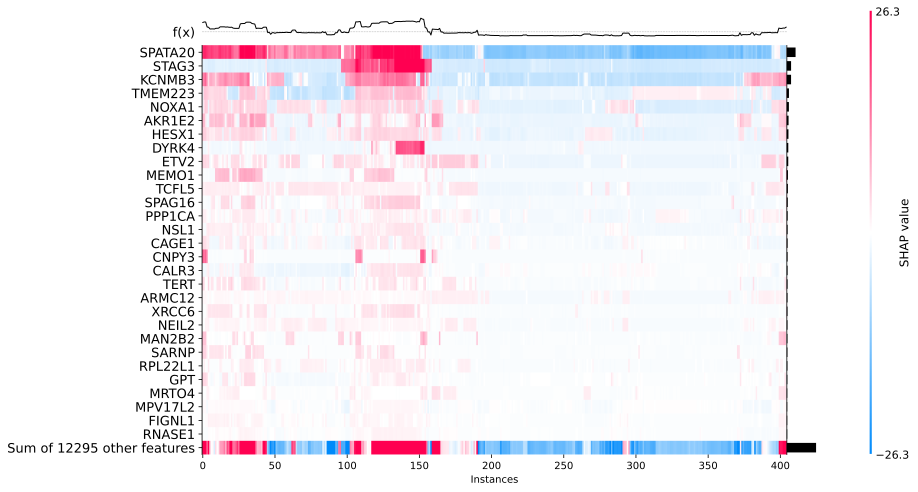

In [30]:
stage_one_gestation_heatmap_path = locations.output.plots / "stage_one" / "heatmap_gestation.svg"
stage_one_gestation.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=True, save=stage_one_gestation_heatmap_path)

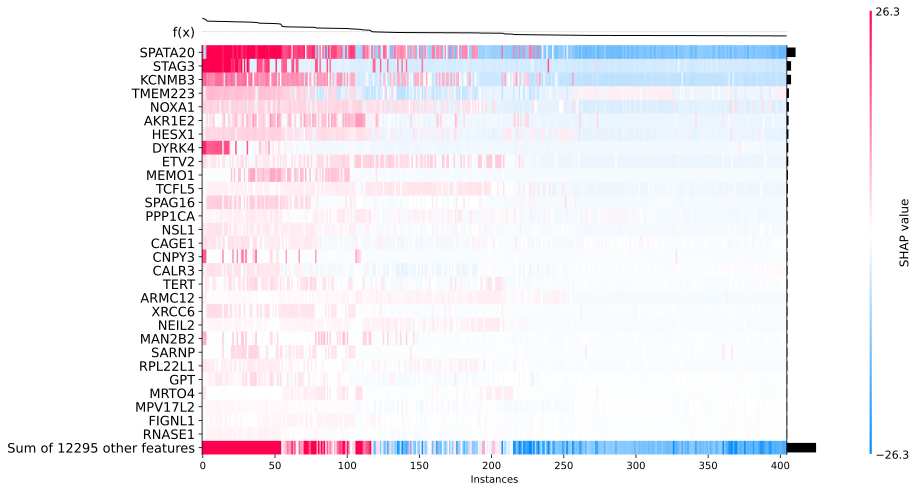

In [31]:
stage_one_gestation_heatmap_unclustered_path = locations.output.plots / "stage_one" / "heatmap_gestation_unclustered.svg"
stage_one_gestation.plot_heatmap(True, max_display = 30, figsize = (14,8), sort_by_clust=False, save=stage_one_gestation_heatmap_unclustered_path)

## Intersect first stages ##

In [32]:
genes = FeatureSummary.concat(stage_one, 2)
genes.shape

(154,)

In [33]:
stage_one["lifespan"].selected.columns

Index(['symbol', 'repeats', 'mean_abs_shap', 'mean_kendall_tau', 'shap_0',
       'kendall_tau_0', 'shap_1', 'kendall_tau_1', 'shap_2', 'kendall_tau_2',
       'shap_3', 'kendall_tau_3', 'shap_4', 'kendall_tau_4', 'shap_5',
       'kendall_tau_5', 'shap_6', 'kendall_tau_6', 'shap_7', 'kendall_tau_7',
       'shap_8', 'kendall_tau_8', 'shap_9', 'kendall_tau_9'],
      dtype='object')

In [35]:
",".join(genes.to_list())

'DYRK4,NFKBIL1,TRAPPC2L,CEL,ETV2,TRIM69,STAG3,FIGNL1,NOXA1,MAN2B2,LRR1,KCNMB3,NOXRED1,RNH1,DPP9,CHCHD3,ARMC12,ATAT1,VARS2,FECH,PPP1CA,TIMP1,CA3,CAPN3,HRH4,SPAG16,VPS28,TERT,RXRB,CALCOCO2,DCTD,SPATA20,DNAJC15,CATSPER3,CR1,RAD51C,TSPAN10,NEIL1,STYXL1,LYG1,CTBS,TMEM115,OPN3,ATP5F1E,CLIC1,RCL1,TAF15,FGF11,GTF3A,NEIL2,PCMTD1,POP5,XRCC6,EIF3K,CAGE1,ZWINT,SFR1,LGALS4,TSPAN17,RPL22L1,YES1,C12orf73,AKR7L,CHCHD4,ERMAP,CETN1,C1orf56,MRPL43,RMND1,GPAT3,NUCKS1,PKN3,ELOC,NEDD4,SS18L2,DMAC1,MMP21,PODN,PRSS53,TMEM167A,RPS8,TCFL5,AKR1E2,JAGN1,DPH3,PIGC,STRC,BRCA2,EMC9,TMEM223,PDCD5,PLXDC2,SBK1,MPEG1,JMJD8,LYPLA1,COX7C,EFCAB11,CHCHD2,TMEM182,DTYMK,TMEM258,NDUFAF2,C6orf89,PLGRKT,MSRA,APRT,ZDHHC12,NDUFA4,CCDC189,SEC61G,PCBP2,USB1,AVEN,STKLD1,OVOL3,HSPB11,OCIAD2,GNAS,RPL35,BTF3L4,GPR160,TIMM8A,TAF12,UQCRB,EIF4EBP1,PRDX1,RTCB,PSMD8,SNAP23,PNLDC1,GNB1L,FAM161A,TMEM143,ANKRD40,MAPK6,MPV17,CCR3,RPAIN,EPHX3,MEMO1,HESX1,CNPY3,GPT,LHX8,SEC11C,CALR3,MRTO4,A2M,TOB2,RPL13A,SPCS2,LPIN3,TMEM70'

## Second stage selection ##

In [36]:
lifespan_selection = selections["lifespan"]

In [37]:
initial_data = lifespan_selection[0] #.by_genes()

In [38]:
genes.to_csv(locations.interim.stage_one / "results_concatenated.tsv", sep="\t", index_label="reference_gene")

In [39]:
stage_two_data = initial_data.by_genes.collect(lambda gs: gs.loc[genes.index.to_list()])
stage_two_data.name = "input"
stage_two_data

expressions,genes,species,samples,Genes Metadata,Species Metadata
"(408, 154)","(154, 37)",38,408,"(154, 2)","(38, 18)"


In [40]:
stage_two_data.write(locations.interim.stage_two)

written input dataset content to ../data/interim/stage_2/input


PosixPath('../data/interim/stage_2/input')

In [41]:
stage_two_selection = (stage_two_data,lifespan_selection[1])

### Save lifespan stage_one summary chart ###

In [42]:
summary_stage_one_plot_path = locations.output.plots / "stage_one_summary_lifespan.svg"
summary_stage_one = stage_one["lifespan"]
stage_one_figure = summary_stage_one.plot(max_display=60, plot_size=0.5, save = summary_stage_one_plot_path)
stage_one_figure

### Saving stage 1 results ###

In [43]:
for k, v in stage_one.items():
    res = v.select_repeated(2)
    res.to_csv(locations.output.stage_one / f"{k}_selected.tsv", sep="\t", index_label="reference_gene")

# Check untuned performance #

In [44]:
result_untuned = pipelines["lifespan"].fit_transform(stage_two_selection)
result_untuned.selected

2020-10-15 23:59:49.390 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 0 =====
2020-10-15 23:59:49.392 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 9}
2020-10-15 23:59:49.400 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 0 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Pan_paniscus']
Found `early_stopping_round` in params. Will use it instead of argument
2020-10-15 23:59:49.506 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 1 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Capra_hircus']
2020-10-15 23:59:49.603 | INFO     | ysp

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[76]	valid_0's l1: 5.79059	valid_0's l2: 89.6789	valid_0's huber: 4.86287
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[102]	valid_0's l1: 2.81617	valid_0's l2: 50.3108	valid_0's huber: 2.21388
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-15 23:59:49.753 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 3 | VALIDATION_SPECIES: ['Macaca_nemestrina', 'Microcebus_murinus']
2020-10-15 23:59:49.941 | INFO     | yspecies.selection:fit:161 - SEED: 0 | FOLD: 4 | VALIDATION_SPECIES: ['Felis_catus', 'Pan_troglodytes']


Early stopping, best iteration is:
[166]	valid_0's l1: 2.90472	valid_0's l2: 22.4486	valid_0's huber: 2.26558
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[196]	valid_0's l1: 2.67902	valid_0's l2: 24.0063	valid_0's huber: 2.08366
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[145]	valid_0's l1: 2.40202	valid_0's l2: 20.0563	valid_0's huber: 1.84099


2020-10-16 00:00:02.708 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9446355398224201, MAE=3.318502594474444, MSE=41.30016696801834, huber=2.6436809430788655)
2020-10-16 00:00:02.713 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 1 =====
2020-10-16 00:00:02.714 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 0}
2020-10-16 00:00:02.718 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 0 | VALIDATION_SPECIES: ['Felis_catus', 'Ursus_americanus']
Found `early_stopping_round` in params. Will use it instead of argument


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[144]	valid_0's l1: 2.69362	valid_0's l2: 20.0917	valid_0's huber: 2.0906
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:02.973 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 2 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Rhinopithecus_bieti']
2020-10-16 00:00:03.069 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 3 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Ovis_aries']


Early stopping, best iteration is:
[146]	valid_0's l1: 4.01429	valid_0's l2: 52.2398	valid_0's huber: 3.26496
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[104]	valid_0's l1: 2.36215	valid_0's l2: 17.1194	valid_0's huber: 1.78426
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:03.217 | INFO     | yspecies.selection:fit:161 - SEED: 1 | FOLD: 4 | VALIDATION_SPECIES: ['Pan_troglodytes', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[174]	valid_0's l1: 4.39743	valid_0's l2: 66.1613	valid_0's huber: 3.62693
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[118]	valid_0's l1: 2.47258	valid_0's l2: 25.3424	valid_0's huber: 1.91713


2020-10-16 00:00:16.691 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9489766324168768, MAE=3.1880121899936995, MSE=36.19091445096325, huber=2.537991226041558)
2020-10-16 00:00:16.696 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 2 =====
2020-10-16 00:00:16.697 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 1}
2020-10-16 00:00:16.701 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 0 | VALIDATION_SPECIES: ['Rhinopithecus_bieti', 'Ursus_americanus']
Found `early_stopping_round` in params. Will use it instead of a

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[95]	valid_0's l1: 3.31097	valid_0's l2: 32.0666	valid_0's huber: 2.64008
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[114]	valid_0's l1: 3.62335	valid_0's l2: 35.3284	valid_0's huber: 2.91743
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:16.967 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 3 | VALIDATION_SPECIES: ['Rattus_norvegicus', 'Monodelphis_domestica']
2020-10-16 00:00:17.052 | INFO     | yspecies.selection:fit:161 - SEED: 2 | FOLD: 4 | VALIDATION_SPECIES: ['Bos_taurus', 'Tupaia_belangeri']


Early stopping, best iteration is:
[92]	valid_0's l1: 3.4164	valid_0's l2: 40.3536	valid_0's huber: 2.72416
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[99]	valid_0's l1: 6.73235	valid_0's l2: 95.9925	valid_0's huber: 5.68458
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[72]	valid_0's l1: 2.52696	valid_0's l2: 25.4814	valid_0's huber: 1.9121


2020-10-16 00:00:26.446 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9231746313892923, MAE=3.9220056060451918, MSE=45.84450958673093, huber=3.176761941458821)
2020-10-16 00:00:26.451 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 3 =====
2020-10-16 00:00:26.452 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 2}
2020-10-16 00:00:26.456 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 0 | VALIDATION_SPECIES: ['Microcebus_murinus', 'Pan_paniscus']
Found `early_stopping_round` in params. Will use it instead of argume

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[107]	valid_0's l1: 2.85502	valid_0's l2: 26.6153	valid_0's huber: 2.22864
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:26.743 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 2 | VALIDATION_SPECIES: ['Bos_taurus', 'Capra_hircus']
2020-10-16 00:00:26.899 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 3 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Mus_musculus']


Early stopping, best iteration is:
[135]	valid_0's l1: 5.74929	valid_0's l2: 78.3423	valid_0's huber: 4.81673
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[149]	valid_0's l1: 2.78009	valid_0's l2: 22.6932	valid_0's huber: 2.17376
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:27.008 | INFO     | yspecies.selection:fit:161 - SEED: 3 | FOLD: 4 | VALIDATION_SPECIES: ['Suricata_suricatta', 'Meriones_unguiculatus']


Early stopping, best iteration is:
[132]	valid_0's l1: 2.13316	valid_0's l2: 30.6294	valid_0's huber: 1.60442
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[95]	valid_0's l1: 2.40329	valid_0's l2: 20.156	valid_0's huber: 1.80291


2020-10-16 00:00:40.525 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9498467395934267, MAE=3.184171710154053, MSE=35.687255034133614, huber=2.5281357142234047)
2020-10-16 00:00:40.530 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 4 =====
2020-10-16 00:00:40.531 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 3}
2020-10-16 00:00:40.535 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_fascicularis', 'Pan_troglodytes']
Found `early_stopping_round` in params. Will use it instead of a

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[118]	valid_0's l1: 2.74377	valid_0's l2: 24.57	valid_0's huber: 2.12875
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:40.773 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 2 | VALIDATION_SPECIES: ['Heterocephalus_glaber', 'Cavia_aperea']
2020-10-16 00:00:40.908 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 3 | VALIDATION_SPECIES: ['Pan_paniscus', 'Gorilla_gorilla']


Early stopping, best iteration is:
[131]	valid_0's l1: 2.83577	valid_0's l2: 22.2076	valid_0's huber: 2.22431
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[153]	valid_0's l1: 4.07117	valid_0's l2: 42.9757	valid_0's huber: 3.33753
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:41.010 | INFO     | yspecies.selection:fit:161 - SEED: 4 | FOLD: 4 | VALIDATION_SPECIES: ['Bos_taurus', 'Equus_caballus']


Early stopping, best iteration is:
[101]	valid_0's l1: 5.18015	valid_0's l2: 96.0752	valid_0's huber: 4.3445
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[134]	valid_0's l1: 2.24188	valid_0's l2: 21.4985	valid_0's huber: 1.70541


2020-10-16 00:00:54.121 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9422194195155207, MAE=3.4145486323229775, MSE=41.465402188062534, huber=2.746767675169509)
2020-10-16 00:00:54.126 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 5 =====
2020-10-16 00:00:54.127 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 4}
2020-10-16 00:00:54.130 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 0 | VALIDATION_SPECIES: ['Mus_spicilegus', 'Canis_lupus_familiaris']
Found `early_stopping_round` in params. Will use it instead of

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[147]	valid_0's l1: 2.70826	valid_0's l2: 19.5236	valid_0's huber: 2.10393
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:54.379 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 2 | VALIDATION_SPECIES: ['Ursus_americanus', 'Oryctolagus_cuniculus']
2020-10-16 00:00:54.488 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_aperea', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[103]	valid_0's l1: 2.88306	valid_0's l2: 28.6988	valid_0's huber: 2.26507
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[125]	valid_0's l1: 5.53511	valid_0's l2: 95.2789	valid_0's huber: 4.63527
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:00:54.585 | INFO     | yspecies.selection:fit:161 - SEED: 5 | FOLD: 4 | VALIDATION_SPECIES: ['Felis_catus', 'Rhinopithecus_bieti']


Early stopping, best iteration is:
[108]	valid_0's l1: 3.15475	valid_0's l2: 32.591	valid_0's huber: 2.51026
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[91]	valid_0's l1: 2.47373	valid_0's l2: 22.7283	valid_0's huber: 1.90577


2020-10-16 00:01:07.305 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9452791461206749, MAE=3.3509808656917683, MSE=39.76414653065923, huber=2.6804755104007483)
2020-10-16 00:01:07.311 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 6 =====
2020-10-16 00:01:07.312 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 5}
2020-10-16 00:01:07.316 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 0 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Heterocephalus_glaber']
Found `early_stopping_round` in params. Will use it 

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[114]	valid_0's l1: 2.99885	valid_0's l2: 27.6691	valid_0's huber: 2.37136
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[104]	valid_0's l1: 2.8617	valid_0's l2: 22.8792	valid_0's huber: 2.24296


2020-10-16 00:01:07.630 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 3 | VALIDATION_SPECIES: ['Cavia_porcellus', 'Pan_troglodytes']


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[116]	valid_0's l1: 3.02829	valid_0's l2: 32.3869	valid_0's huber: 2.40229
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:01:07.761 | INFO     | yspecies.selection:fit:161 - SEED: 6 | FOLD: 4 | VALIDATION_SPECIES: ['Vombatus_ursinus', 'Sus_scrofa']


Early stopping, best iteration is:
[166]	valid_0's l1: 4.28116	valid_0's l2: 49.6422	valid_0's huber: 3.51703
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[112]	valid_0's l1: 2.6774	valid_0's l2: 30.076	valid_0's huber: 2.08374


2020-10-16 00:01:20.236 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.95314996467533, MAE=3.1694798107402216, MSE=32.53069231904082, huber=2.5227141688524677)
2020-10-16 00:01:20.241 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 7 =====
2020-10-16 00:01:20.242 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 6}
2020-10-16 00:01:20.246 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 0 | VALIDATION_SPECIES: ['Macaca_mulatta', 'Cavia_porcellus']
Found `early_stopping_round` in params. Will use it instead of argument

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[152]	valid_0's l1: 3.05556	valid_0's l2: 26.0361	valid_0's huber: 2.39316
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[98]	valid_0's l1: 3.03928	valid_0's l2: 36.0531	valid_0's huber: 2.41797


2020-10-16 00:01:20.607 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 3 | VALIDATION_SPECIES: ['Canis_lupus_familiaris', 'Ursus_americanus']


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[179]	valid_0's l1: 3.2384	valid_0's l2: 27.9326	valid_0's huber: 2.5855
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:01:20.696 | INFO     | yspecies.selection:fit:161 - SEED: 7 | FOLD: 4 | VALIDATION_SPECIES: ['Tupaia_belangeri', 'Ailuropoda_melanoleuca']


Early stopping, best iteration is:
[97]	valid_0's l1: 3.24259	valid_0's l2: 38.7071	valid_0's huber: 2.59708
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[66]	valid_0's l1: 2.1179	valid_0's l2: 14.6252	valid_0's huber: 1.59645


2020-10-16 00:01:31.578 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9596071362747052, MAE=2.9387464194721753, MSE=28.670806419187546, huber=2.3165532508835014)
2020-10-16 00:01:31.584 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 8 =====
2020-10-16 00:01:31.584 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 7}
2020-10-16 00:01:31.588 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 0 | VALIDATION_SPECIES: ['Pan_paniscus', 'Suricata_suricatta']
Found `early_stopping_round` in params. Will use it instead of argu

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[117]	valid_0's l1: 3.09994	valid_0's l2: 23.2592	valid_0's huber: 2.43884
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:01:31.818 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 2 | VALIDATION_SPECIES: ['Ursus_americanus', 'Capra_hircus']
2020-10-16 00:01:32.008 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 3 | VALIDATION_SPECIES: ['Bos_taurus', 'Rhinolophus_ferrumequinum']


Early stopping, best iteration is:
[109]	valid_0's l1: 2.6829	valid_0's l2: 18.2125	valid_0's huber: 2.08622
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
[250]	valid_0's l1: 3.16782	valid_0's l2: 32.332	valid_0's huber: 2.53524
Did not meet early stopping. Best iteration is:
[249]	valid_0's l1: 3.1657	valid_0's l2: 32.3033	valid_0's huber: 2.53388


2020-10-16 00:01:32.156 | INFO     | yspecies.selection:fit:161 - SEED: 8 | FOLD: 4 | VALIDATION_SPECIES: ['Oryctolagus_cuniculus', 'Sus_scrofa']


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[183]	valid_0's l1: 3.08488	valid_0's l2: 42.3398	valid_0's huber: 2.43854
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[98]	valid_0's l1: 3.88585	valid_0's l2: 66.1188	valid_0's huber: 3.18831


2020-10-16 00:01:47.212 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9457796833516866, MAE=3.183854539293491, MSE=36.44670876496049, huber=2.535090979160705)
2020-10-16 00:01:47.217 | INFO     | yspecies.selection:fit:157 - ===== fitting models with seed 9 =====
2020-10-16 00:01:47.217 | INFO     | yspecies.selection:fit:158 - PARAMETERS:
{'bagging_fraction': 0.9223944053685549, 'boosting_type': 'gbdt', 'drop_rate': 0.29847846764282016, 'feature_fraction': 0.30501714460224083, 'lambda_l1': 0.21894440516534, 'lambda_l2': 1.3848191603958375, 'learning_rate': 0.08210966706622723, 'max_depth': 3, 'max_leaves': 17, 'min_data_in_leaf': 8, 'objective': 'regression', 'metrics': ['l1', 'l2', 'huber'], 'verbose': -1, 'early_stopping_round': 10, 'seed': 8}
2020-10-16 00:01:47.221 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 0 | VALIDATION_SPECIES: ['Ictidomys_tridecemlineatus', 'Aotus_nancymaae']
Found `early_stopping_round` in params. Will use it instead

Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[136]	valid_0's l1: 2.41901	valid_0's l2: 15.4097	valid_0's huber: 1.86842
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[79]	valid_0's l1: 4.89721	valid_0's l2: 61.6056	valid_0's huber: 4.06908


2020-10-16 00:01:47.553 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 3 | VALIDATION_SPECIES: ['Gorilla_gorilla', 'Microcebus_murinus']


Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[140]	valid_0's l1: 3.96563	valid_0's l2: 32.864	valid_0's huber: 3.21654
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds


2020-10-16 00:01:47.664 | INFO     | yspecies.selection:fit:161 - SEED: 9 | FOLD: 4 | VALIDATION_SPECIES: ['Rhinolophus_ferrumequinum', 'Felis_catus']


Early stopping, best iteration is:
[135]	valid_0's l1: 4.69463	valid_0's l2: 70.158	valid_0's huber: 3.87995
Training until validation scores don't improve for 10 rounds
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[108]	valid_0's l1: 2.83586	valid_0's l2: 20.3002	valid_0's huber: 2.20921


2020-10-16 00:02:00.665 | INFO     | yspecies.explanations:transform:642 - Metrics: 
Metrics(R2=0.9439975429644903, MAE=3.762469605353533, MSE=40.0674888940644, huber=3.042944256842235)


,symbol,repeats,mean_abs_shap,mean_kendall_tau,shap_0,kendall_tau_0,shap_1,kendall_tau_1,shap_2,kendall_tau_2,shap_3,kendall_tau_3,shap_4,kendall_tau_4,shap_5,kendall_tau_5,shap_6,kendall_tau_6,shap_7,kendall_tau_7,shap_8,kendall_tau_8,shap_9,kendall_tau_9
ENSG00000010219,DYRK4,10.000,2.511,0.440,2.040,0.426,2.409,0.285,2.842,0.510,3.244,0.394,2.455,0.535,2.083,0.554,1.791,0.501,2.749,0.405,2.707,0.336,2.791,0.458
ENSG00000204498,NFKBIL1,10.000,2.020,-0.420,1.798,-0.602,2.341,-0.393,2.610,-0.410,2.472,-0.374,2.198,-0.394,1.555,-0.354,1.581,-0.359,2.711,-0.496,1.146,-0.636,1.789,-0.184
ENSG00000167515,TRAPPC2L,10.000,1.701,-0.397,1.544,-0.282,1.755,-0.274,1.854,-0.416,1.880,-0.324,1.991,-0.659,1.495,-0.304,1.212,-0.443,2.648,-0.338,1.310,-0.343,1.325,-0.585
ENSG00000066923,STAG3,10.000,1.158,0.489,1.440,0.445,1.329,0.523,0.958,0.500,1.115,0.580,0.638,0.446,2.079,0.398,0.702,0.458,1.099,0.485,1.003,0.547,1.214,0.509
ENSG00000105672,ETV2,10.000,1.114,0.669,0.860,0.725,1.393,0.624,1.148,0.696,1.193,0.633,1.224,0.687,1.165,0.697,0.779,0.614,1.433,0.639,1.137,0.686,0.813,0.685
ENSG00000170835,CEL,10.000,0.966,0.694,0.933,0.677,1.268,0.690,1.399,0.685,1.032,0.737,0.643,0.680,0.508,0.697,0.918,0.684,1.110,0.673,0.957,0.674,0.888,0.737
ENSG00000092529,CAPN3,10.000,0.962,0.505,2.113,0.589,1.070,0.446,1.055,0.483,0.737,0.503,0.732,0.319,1.067,0.479,0.669,0.606,0.863,0.482,0.666,0.549,0.645,0.593
ENSG00000106554,CHCHD3,10.000,0.870,-0.560,0.393,-0.669,1.125,-0.515,1.062,-0.605,1.544,-0.539,0.468,-0.523,0.413,-0.468,1.167,-0.476,0.424,-0.668,0.739,-0.550,1.367,-0.583
ENSG00000185880,TRIM69,10.000,0.767,-0.027,0.474,-0.081,0.586,-0.141,0.978,0.038,1.010,-0.192,0.764,0.119,0.562,0.029,1.490,0.034,0.615,0.324,0.314,-0.246,0.880,-0.150
ENSG00000171121,KCNMB3,10.000,0.614,0.640,0.567,0.638,0.552,0.676,0.682,0.606,0.269,0.677,0.661,0.588,0.600,0.656,1.029,0.646,0.476,0.626,0.744,0.589,0.564,0.701


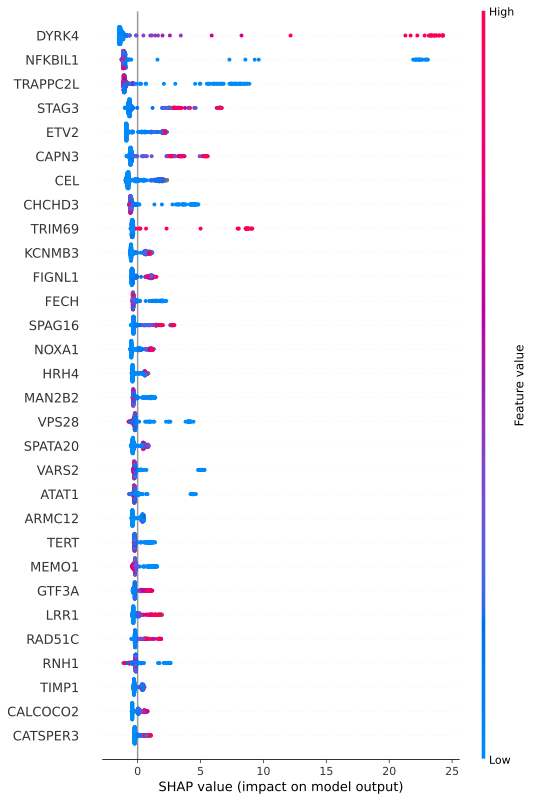

In [45]:
summary_stage_two_untuned_plot_path = locations.output.dir / "plots" / "stage_two_untuned_summary_lifespan.svg"
summary_stage_two_untuned = result_untuned.plot(max_display=30, plot_size=0.4, save = summary_stage_two_untuned_plot_path)
summary_stage_two_untuned

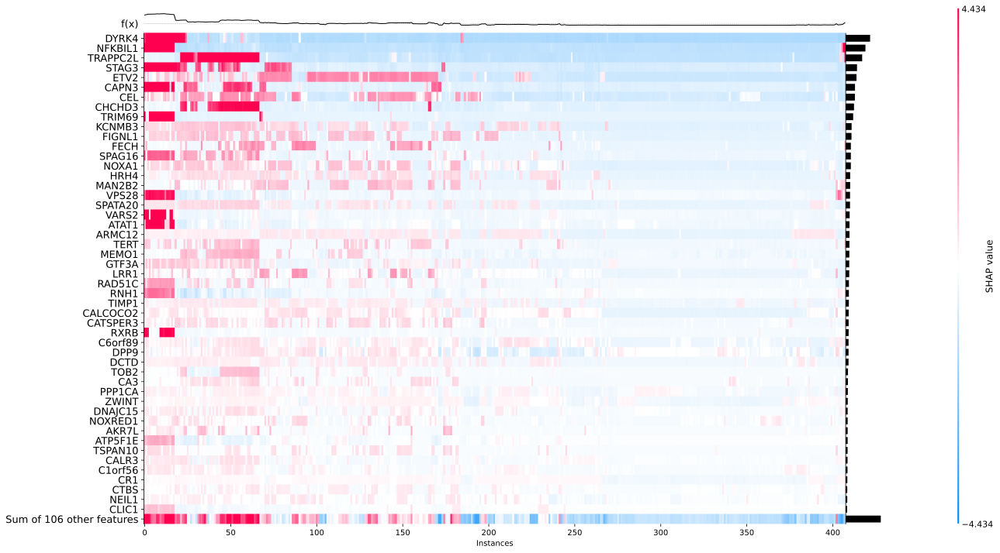

In [46]:
heatmap_stage_two_untuned_plot_path = locations.output.plots / "heatmap_lifespan_untuned_stage_two.svg"
result_untuned.plot_heatmap(True, max_display = 50, figsize = (24,12), sort_by_clust=True, save = heatmap_stage_two_untuned_plot_path)

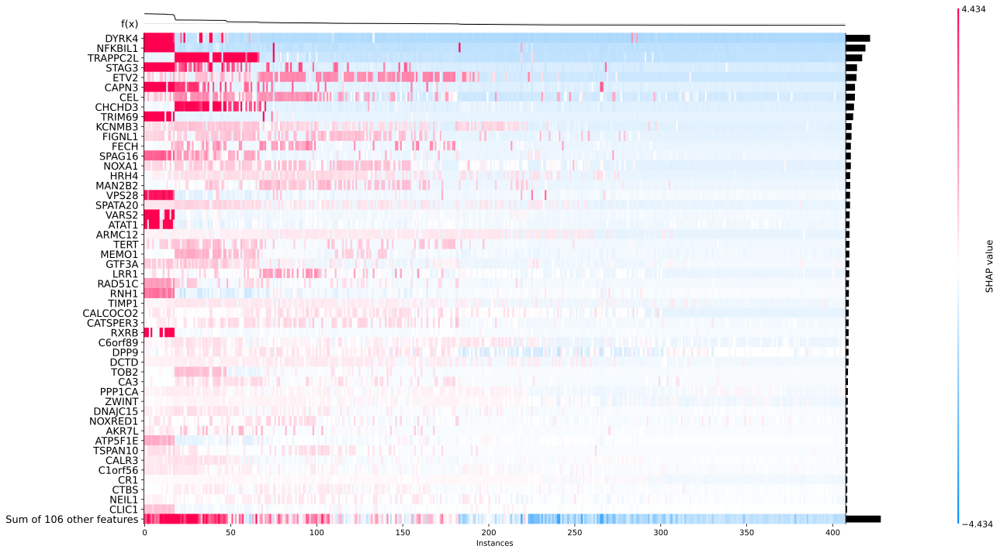

In [47]:
heatmap_stage_two_untuned_unclustered_plot_path = locations.output.plots / "heatmap_lifespan_untuned_unclustered_stage_two.svg"
result_untuned.plot_heatmap(True, max_display = 50, figsize = (24,12), sort_by_clust=False, save = heatmap_stage_two_untuned_unclustered_plot_path)

### Comparing metrics ###

In [48]:
stage_one["lifespan"].metrics_average

Metrics(R2=0.9248497154185497, MAE=3.8751569095244056, MSE=52.84425262563819, huber=3.1501688738133113)

In [49]:
stage_one["lifespan"].symbols_repeated(6).values

array(['DYRK4', 'NFKBIL1', 'TRAPPC2L', 'CEL', 'ETV2', 'TRIM69', 'STAG3',
       'FIGNL1', 'NOXA1', 'MAN2B2', 'LRR1', 'KCNMB3', 'NOXRED1', 'RNH1',
       'DPP9', 'CHCHD3', 'ARMC12', 'ATAT1', 'VARS2', 'FECH', 'PPP1CA'],
      dtype=object)

In [50]:
stage_one["lifespan"].symbols_repeated(2).index

Index(['ENSG00000010219', 'ENSG00000204498', 'ENSG00000167515',
       'ENSG00000170835', 'ENSG00000105672', 'ENSG00000185880',
       'ENSG00000066923', 'ENSG00000132436', 'ENSG00000188747',
       'ENSG00000013288', 'ENSG00000165501', 'ENSG00000171121',
       'ENSG00000165555', 'ENSG00000023191', 'ENSG00000142002',
       'ENSG00000106554', 'ENSG00000157343', 'ENSG00000137343',
       'ENSG00000137411', 'ENSG00000066926', 'ENSG00000172531',
       'ENSG00000102265', 'ENSG00000164879', 'ENSG00000092529',
       'ENSG00000134489', 'ENSG00000144451', 'ENSG00000160948',
       'ENSG00000164362', 'ENSG00000204231', 'ENSG00000136436',
       'ENSG00000129187', 'ENSG00000006282', 'ENSG00000120675',
       'ENSG00000152705', 'ENSG00000203710', 'ENSG00000108384',
       'ENSG00000182612', 'ENSG00000140398', 'ENSG00000127952'],
      dtype='object')

In [51]:
(stage_one["lifespan"].symbols_repeated(2).shape, result_untuned.symbols_repeated(2).shape)

((39,), (136,))

In [52]:
result_untuned.metrics_average

Metrics(R2=0.9456666436124423, MAE=3.343277197354155, MSE=37.79680911558212, huber=2.673111566611181)